In [ ]:
!pip install wquantiles

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
import matplotlib.patches as mpatches
import wquantiles
import statsmodels.stats.weightstats as ws
import json
import matplotlib.patches as mpatches

In [ ]:
df = pd.read_csv("data/df_asec.csv")

In [ ]:
educ_labels = pd.read_csv("data/educ-labels.csv")
race_labels = pd.read_csv("data/race-labels.csv")
marst_labels = pd.read_csv("data/marst-labels.csv")
emp_labels = pd.read_csv("data/empstat-labels.csv")
occ2010_labels = pd.read_csv("data/occ2010_labels.csv")
sex_labels = {1: 'Male', 2: 'Female', 9: 'NIU'}

In [ ]:
df.head()

,YEAR,SERIAL,MONTH,CPSID,ASECFLAG,HFLAG,ASECWTH,PERNUM,CPSIDV,CPSIDP,...,QIND,QOCC,EDUC,QEDUC,ASECOVERP,OCCLY,OCC10LY,QOCCLY,INCWAGE,HOURWAGE
0,2000,2,3,19981202520100,1,NaN,974.38,1,199812025201011,19981202520101,...,0,0,125,0,0,146,2200,0,44600,999.99
1,2000,2,3,19981202520100,1,NaN,974.38,2,199812025201021,19981202520102,...,0,0,50,0,0,877,9620,0,2000,5.25
2,2000,3,3,20000103263800,1,NaN,809.33,1,200001032638011,20000103263801,...,0,0,81,0,0,0,9999,0,0,999.99
3,2000,3,3,20000103263800,1,NaN,809.33,2,200001032638021,20000103263802,...,0,0,81,0,0,505,7200,0,12000,999.99
4,2000,4,3,20000102304500,1,NaN,946.16,1,200001023045011,20000102304501,...,0,0,73,0,0,274,4965,0,20000,999.99


# Data Preparation

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4608387 entries, 0 to 4608386
Data columns (total 31 columns):
 #   Column     Dtype  
---  ------     -----  
 0   YEAR       int64  
 1   SERIAL     int64  
 2   MONTH      int64  
 3   CPSID      int64  
 4   ASECFLAG   int64  
 5   HFLAG      float64
 6   ASECWTH    float64
 7   PERNUM     int64  
 8   CPSIDV     int64  
 9   CPSIDP     int64  
 10  ASECWT     float64
 11  ASECWTCVD  float64
 12  AGE        int64  
 13  SEX        int64  
 14  RACE       int64  
 15  MARST      int64  
 16  QRACE      float64
 17  EMPSTAT    int64  
 18  LABFORCE   int64  
 19  OCC        int64  
 20  OCC2010    int64  
 21  IND        int64  
 22  QIND       int64  
 23  QOCC       int64  
 24  EDUC       int64  
 25  QEDUC      int64  
 26  ASECOVERP  int64  
 27  OCCLY      int64  
 28  OCC10LY    int64  
 29  QOCCLY     int64  
 30  HOURWAGE   float64
dtypes: float64(6), int64(25)
memory usage: 1.1 GB


In [ ]:
# numerical variables discriptive statistics
df.describe()

,YEAR,SERIAL,MONTH,CPSID,ASECFLAG,HFLAG,ASECWTH,PERNUM,CPSIDV,CPSIDP,...,QIND,QOCC,EDUC,QEDUC,ASECOVERP,OCCLY,OCC10LY,QOCCLY,INCWAGE,HOURWAGE
count,4.608387e+06,4.608387e+06,4608387.0,4.608387e+06,4608387.0,199556.000000,4.608387e+06,4.608387e+06,4.608387e+06,4.608387e+06,...,4.608387e+06,4.608387e+06,4.608387e+06,4.608387e+06,4.608387e+06,4.608387e+06,4.608387e+06,4.608387e+06,4.608387e+06,4.608387e+06
mean,2.011006e+03,4.873736e+04,3.0,1.307582e+13,1.0,0.301374,1.629364e+03,2.271457e+00,1.307582e+14,1.307582e+13,...,1.521660e-02,1.666700e-02,6.269469e+01,2.286093e-02,3.495666e-01,1.907721e+03,7.096216e+03,2.743259e-03,2.343730e+07,9.567795e+02
std,6.673687e+00,2.798134e+04,0.0,9.586048e+12,0.0,0.458856,1.163772e+03,1.386539e+00,9.586048e+13,9.586048e+12,...,2.462415e-01,2.576630e-01,4.093513e+01,1.494601e-01,4.768331e-01,2.719664e+03,3.410551e+03,5.230425e-02,4.233570e+07,2.016980e+02
min,2.000000e+03,1.000000e+00,3.0,0.000000e+00,1.0,0.000000,2.533000e+01,1.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+01,0.000000e+00,0.000000e+00,2.500000e-01
25%,2.005000e+03,2.443700e+04,3.0,0.000000e+00,1.0,0.000000,8.065100e+02,1.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,2.000000e+01,0.000000e+00,0.000000e+00,0.000000e+00,4.250000e+03,0.000000e+00,0.000000e+00,9.999900e+02
50%,2.011000e+03,4.862700e+04,3.0,2.004030e+13,1.0,0.000000,1.484000e+03,2.000000e+00,2.004030e+14,2.004030e+13,...,0.000000e+00,0.000000e+00,7.300000e+01,0.000000e+00,0.000000e+00,2.000000e+01,9.620000e+03,0.000000e+00,2.800000e+04,9.999900e+02
75%,2.017000e+03,7.319500e+04,3.0,2.013011e+13,1.0,1.000000,2.117050e+03,3.000000e+00,2.013011e+14,2.013011e+13,...,0.000000e+00,0.000000e+00,9.100000e+01,0.000000e+00,1.000000e+00,4.030000e+03,9.999000e+03,0.000000e+00,1.450000e+05,9.999900e+02
max,2.023000e+03,9.998600e+04,3.0,2.023031e+13,1.0,1.000000,2.865431e+04,1.600000e+01,2.023031e+14,2.023031e+13,...,4.000000e+00,4.000000e+00,1.250000e+02,1.000000e+00,1.000000e+00,9.840000e+03,9.999000e+03,1.000000e+00,1.000000e+08,9.999900e+02


In [ ]:
df.isna().sum().sum(), df.isna().sum()

(9985454,
 YEAR               0
 SERIAL             0
 MONTH              0
 CPSID              0
 ASECFLAG           0
 HFLAG        4408831
 ASECWTH            0
 PERNUM             0
 CPSIDV             0
 CPSIDP             0
 ASECWT             0
 ASECWTCVD    4106784
 AGE                0
 SEX                0
 RACE               0
 MARST              0
 QRACE        1469839
 EMPSTAT            0
 LABFORCE           0
 OCC                0
 OCC2010            0
 IND                0
 QIND               0
 QOCC               0
 EDUC               0
 QEDUC              0
 ASECOVERP          0
 OCCLY              0
 OCC10LY            0
 QOCCLY             0
 INCWAGE            0
 HOURWAGE           0
 dtype: int64)

In [ ]:
year_start = 2000
year_end = 2023 + 1 # up to 2023
years = [i for i in range(year_start, year_end)]
# Outdated info on 2014
# print("Remove year 2014 since problems in data")
# years.remove(2014)

In [ ]:
a = set(df["OCC2010"].unique())
b = set(df["OCC10LY"].unique())
b.difference(a)
# no unemployment codes

set()

In [ ]:
# INCWAGE: Missing values
# 9999999 = N.I.U. (Not in Universe).
# 9999998 = Missing.
df.loc[df.INCWAGE == 9999998, 'INCWAGE']
df.loc[df.INCWAGE == 9999999, 'INCWAGE']

Series([], Name: INCWAGE, dtype: int64)

No missing income values.

In [ ]:
# filter by those with ASECFLAG, AGE and Emp status
df = df[df["ASECFLAG"] == 1]
df = df[df["AGE"] >= 18]
# keep "At work", "Has job, not at work last week"
employed_codes = [10, 12]
df = df[df["EMPSTAT"].isin(employed_codes)]

# remove CPSIDP unless they are part of the asec over sample
df = df[(df["CPSIDP"] != 0) | (df["ASECOVERP"] == 1)]
df = df[df["YEAR"].isin(years)]

In [ ]:
df[(df["YEAR"] == 2014)][['HFLAG','ASECWT']]

,HFLAG,ASECWT
2857854,0.0,569.48
2857855,0.0,569.48
2857856,0.0,512.13
2857859,0.0,564.01
2857861,0.0,564.01
...,...,...
3057400,1.0,591.24
3057401,1.0,704.66
3057403,1.0,768.15
3057404,1.0,768.15


Remove HFLAG as it's not relevant for this research.

In [ ]:
df_clean = df.drop(columns='HFLAG')

ASECWTCVD is available from 2019-2021. ASECWT should be used for all other ASEC years. From: https://cps.ipums.org/cps-action/variables/ASECWTCVD#description_section

In [ ]:
# Create a new column with the appropriate weight values based on the year
df_clean['WEIGHT'] = np.where(
    (df_clean['YEAR'] < 2019) | (df_clean['YEAR'] > 2021),
    df_clean['ASECWT'],
    df_clean['ASECWTCVD']
)

Mapping OCC2010 codes to larger fields using the info here: https://cps.ipums.org/cps-action/variables/OCC2010#description_section

In [ ]:
# Define a dictionary mapping occupation fields to code ranges
occupation_ranges = {
    "Management in Business, Science, and Arts": range(10, 431),
    "Business Operations Specialists": range(500, 731),
    "Financial Specialists": range(800, 951),
    "Computer and Mathematical": range(1000, 1241),
    "Architecture and Engineering": range(1300, 1541),
    "Technicians": range(1550, 1561),
    "Life, Physical, and Social Science": range(1600, 1981),
    "Community and Social Services": range(2000, 2061),
    "Legal": range(2100, 2151),
    "Education, Training, and Library": range(2200, 2551),
    "Arts, Design, Entertainment, Sports, and Media": range(2600, 2921),
    "Healthcare Practitioners and Technicians": range(3000, 3541),
    "Healthcare Support": range(3600, 3651),
    "Protective Service": range(3700, 3951),
    "Food Preparation and Serving": range(4000, 4151),
    "Building and Grounds Cleaning and Maintenance": range(4200, 4251),
    "Personal Care and Service": range(4300, 4651),
    "Sales and Related": range(4700, 4966),
    "Office and Administrative Support": range(5000, 5941),
    "Farming, Fisheries, and Forestry": range(6005, 6131),
    "Construction": range(6200, 6766),
    "Extraction": range(6800, 6941),
    "Installation, Maintenance, and Repair": range(7000, 7631),
    "Production": range(7700, 8966),
    "Transportation and Material Moving": range(9000, 9751),
    "Military": range(9800, 9831),
    "No Occupation": [9920]
}

# Define a function to map OCC2010 codes to occupation fields
def map_occupation_field(code):
    for field, code_range in occupation_ranges.items():
        if code in code_range:
            return field
    return "Unknown"

# Add a new column OCC_FIELD to df_clean using the map_occupation_field function
df_clean['OCC_FIELD'] = df_clean['OCC2010'].apply(map_occupation_field)
df_clean['OCC_FIELD_LY'] = df_clean['OCC10LY'].apply(map_occupation_field)

Since there are lots of subgroups withing the variable RACE, we will create a new variable that will combine them into groups using the info here: https://cps.ipums.org/cps-action/variables/RACE#codes_section

In [ ]:
# Define the code ranges and their corresponding big group names
code_ranges = {
    (100,): 'White',  # White
    (200,): 'Black',
    (300,): 'American Indian/Aleut/Eskimo',
    range(600, 700): 'Asian or Pacific Islander',  # Asian or Pacific Islander
    (700,): 'Other (single) race, n.e.c.',
    range(800, 900): 'Multiple Races',
    (999,): 'Unknown'
}

# Map each label to its corresponding big group name based on the code ranges
def map_label_to_race(code):
    for code_range, race_group in code_ranges.items():
        if isinstance(code_range, range):
            if code in code_range:
                return race_group
        else:
            if code == code_range[0]:
                return race_group
    return 'Unknown'  # If label does not fall into any defined range

# Apply the mapping function to create a new column 'RACE_GROUP'
df_clean['RACE_GROUP'] = df_clean['RACE'].apply(map_label_to_race)


Let's look at which columns have a single value and drop them.

In [ ]:
single_unique_columns = df_clean.columns[df_clean.nunique() == 1]
print("Columns with just one unique value:")
print(single_unique_columns)
df_clean.drop(columns=single_unique_columns, inplace=True)

Columns with just one unique value:
Index(['MONTH', 'ASECFLAG', 'LABFORCE'], dtype='object')


In [ ]:
df_clean.head()

,YEAR,SERIAL,CPSID,ASECWTH,PERNUM,CPSIDV,CPSIDP,ASECWT,ASECWTCVD,AGE,...,QEDUC,ASECOVERP,OCCLY,OCC10LY,QOCCLY,INCWAGE,HOURWAGE,WEIGHT,OCC_FIELD,RACE_GROUP
0,2000,2,19981202520100,974.38,1,199812025201011,19981202520101,974.38,NaN,51,...,0,0,146,2200,0,44600,999.99,974.38,"Education, Training, and Library",White
3,2000,3,20000103263800,809.33,2,200001032638021,20000103263802,1151.48,NaN,22,...,0,0,505,7200,0,12000,999.99,1151.48,"Installation, Maintenance, and Repair",White
4,2000,4,20000102304500,946.16,1,200001023045011,20000102304501,946.16,NaN,48,...,0,0,274,4965,0,20000,999.99,946.16,Sales and Related,White
5,2000,5,20000103309500,877.98,1,200001033095011,20000103309501,877.98,NaN,43,...,0,0,385,5810,0,2000,999.99,877.98,Office and Administrative Support,White
8,2000,6,20000203375200,1053.90,1,200002033752011,20000203375201,1053.90,NaN,44,...,0,0,156,2310,0,32000,999.99,1053.90,"Education, Training, and Library",White


In [ ]:
df_clean.to_csv("data/df_asec_clean.csv", index=False)

# EDA

In [ ]:
df_clean = pd.read_csv("data/df_asec_clean.csv")
# let's focus on the relevant columns for the EDA
#columns_to_keep = ['YEAR', 'AGE', 'SEX', 'RACE', 'MARST', 'EMPSTAT', 'OCC', 'OCC2010', 'EDUC', 'OCCLY', 'OCC10LY', 'INCWAGE', 'WEIGHT', 'OCC_FIELD', 'OCC_FIELD_LY', 'RACE_GROUP']
columns_to_keep = ['YEAR', 'AGE', 'SEX', 'RACE', 'MARST', 'EMPSTAT', 'OCC2010', 'EDUC', 'OCC10LY', 'INCWAGE', 'WEIGHT', 'OCC_FIELD', 'OCC_FIELD_LY', 'RACE_GROUP']
df = df_clean[columns_to_keep].copy()

## Summary Statistics

In [ ]:
df_clean.head()

,YEAR,SERIAL,CPSID,ASECWTH,PERNUM,CPSIDV,CPSIDP,ASECWT,ASECWTCVD,AGE,...,ASECOVERP,OCCLY,OCC10LY,QOCCLY,INCWAGE,HOURWAGE,WEIGHT,OCC_FIELD,OCC_FIELD_LY,RACE_GROUP
0,2000,2,19981202520100,974.38,1,199812025201011,19981202520101,974.38,NaN,51,...,0,146,2200,0,44600,999.99,974.38,"Education, Training, and Library","Education, Training, and Library",White
1,2000,3,20000103263800,809.33,2,200001032638021,20000103263802,1151.48,NaN,22,...,0,505,7200,0,12000,999.99,1151.48,"Installation, Maintenance, and Repair","Installation, Maintenance, and Repair",White
2,2000,4,20000102304500,946.16,1,200001023045011,20000102304501,946.16,NaN,48,...,0,274,4965,0,20000,999.99,946.16,Sales and Related,Sales and Related,White
3,2000,5,20000103309500,877.98,1,200001033095011,20000103309501,877.98,NaN,43,...,0,385,5810,0,2000,999.99,877.98,Office and Administrative Support,Office and Administrative Support,White
4,2000,6,20000203375200,1053.90,1,200002033752011,20000203375201,1053.90,NaN,44,...,0,156,2310,0,32000,999.99,1053.90,"Education, Training, and Library","Education, Training, and Library",White


In [ ]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2090873 entries, 0 to 2090872
Data columns (total 31 columns):
 #   Column      Dtype  
---  ------      -----  
 0   YEAR        int64  
 1   SERIAL      int64  
 2   CPSID       int64  
 3   ASECWTH     float64
 4   PERNUM      int64  
 5   CPSIDV      int64  
 6   CPSIDP      int64  
 7   ASECWT      float64
 8   ASECWTCVD   float64
 9   AGE         int64  
 10  SEX         int64  
 11  RACE        int64  
 12  MARST       int64  
 13  QRACE       float64
 14  EMPSTAT     int64  
 15  OCC         int64  
 16  OCC2010     int64  
 17  IND         int64  
 18  QIND        int64  
 19  QOCC        int64  
 20  EDUC        int64  
 21  QEDUC       int64  
 22  ASECOVERP   int64  
 23  OCCLY       int64  
 24  OCC10LY     int64  
 25  QOCCLY      int64  
 26  INCWAGE     int64  
 27  HOURWAGE    float64
 28  WEIGHT      float64
 29  OCC_FIELD   object 
 30  RACE_GROUP  object 
dtypes: float64(6), int64(23), object(2)
memory usage: 494.5+ 

- **Rows:** 2090873 entries
- **Data columns:** 31 columns
- **Notable Attributes:**
  - `YEAR`: int64 - Year of the survey
  - `AGE`: int64 - Age of the person
  - `SEX`: int64 - Gender of the person
  - `RACE`: int64 - Race of the person (more specific)
  - `MARST`: int64 - Marital status of the person
  - `EMPSTAT`: int64 - Employment status of the person
  - `OCC2010`: int64 - Occupation code (2010 basis)
  - `EDUC`: int64 - Education level of the person
  - `OCC10LY`: int64 - Occupation last year (2010 basis)
  - `INCWAGE`: int64 - Wage and salary income
  - `WEIGHT`: float64 - Weight associated with the individual, used for survey sampling adjustments
  - `OCC_FIELD`: object - Field of occupation
  - `OCC_FIELD_LY`: object - Field of occupation last year
  - `RACE_GROUP`: object - Race of the person (more general)

In [ ]:
# missing values
df_clean.isna().sum().sum(), df_clean.isna().sum()

(2534796,
 YEAR                  0
 SERIAL                0
 CPSID                 0
 ASECWTH               0
 PERNUM                0
 CPSIDV                0
 CPSIDP                0
 ASECWT                0
 ASECWTCVD       1863773
 AGE                   0
 SEX                   0
 RACE                  0
 MARST                 0
 QRACE            671023
 EMPSTAT               0
 OCC                   0
 OCC2010               0
 IND                   0
 QIND                  0
 QOCC                  0
 EDUC                  0
 QEDUC                 0
 ASECOVERP             0
 OCCLY                 0
 OCC10LY               0
 QOCCLY                0
 INCWAGE               0
 HOURWAGE              0
 WEIGHT                0
 OCC_FIELD             0
 OCC_FIELD_LY          0
 RACE_GROUP            0
 dtype: int64)

In [ ]:
# numerical variables discriptive statistics
df.describe()

,YEAR,AGE,SEX,RACE,MARST,EMPSTAT,OCC,OCC2010,IND,EDUC,OCCLY,OCC10LY,INCWAGE,WEIGHT
count,2.090873e+06,2.090873e+06,2.090873e+06,2.090873e+06,2.090873e+06,2.090873e+06,2.090873e+06,2.090873e+06,2.090873e+06,2.090873e+06,2.090873e+06,2.090873e+06,2.090873e+06,2.090873e+06
mean,2.010974e+03,4.180251e+01,1.480409e+00,1.582998e+02,2.701239e+00,1.006696e+01,3.670176e+03,4.168181e+03,5.532352e+03,8.801512e+01,3.579243e+03,4.297815e+03,4.408899e+04,1.710992e+03
std,6.702629e+00,1.325409e+01,4.996162e-01,1.580574e+02,2.177779e+00,3.597742e-01,2.742297e+03,2.611343e+03,3.141653e+03,2.348730e+01,2.769281e+03,2.731060e+03,5.913159e+04,1.228468e+03
min,2.000000e+03,1.800000e+01,1.000000e+00,1.000000e+02,1.000000e+00,1.000000e+01,4.000000e+00,1.000000e+01,1.000000e+01,2.000000e+00,0.000000e+00,1.000000e+01,0.000000e+00,2.533000e+01
25%,2.005000e+03,3.100000e+01,1.000000e+00,1.000000e+02,1.000000e+00,1.000000e+01,8.040000e+02,2.200000e+03,2.370000e+03,7.300000e+01,7.380000e+02,2.200000e+03,1.500000e+04,8.262000e+02
50%,2.011000e+03,4.100000e+01,1.000000e+00,1.000000e+02,1.000000e+00,1.000000e+01,3.920000e+03,4.230000e+03,6.890000e+03,8.100000e+01,3.700000e+03,4.250000e+03,3.143700e+04,1.536760e+03
75%,2.017000e+03,5.100000e+01,2.000000e+00,1.000000e+02,6.000000e+00,1.000000e+01,5.400000e+03,5.700000e+03,8.170000e+03,1.110000e+02,5.330000e+03,5.860000e+03,5.500000e+04,2.301000e+03
max,2.023000e+03,9.000000e+01,2.000000e+00,8.300000e+02,6.000000e+00,1.200000e+01,9.760000e+03,9.750000e+03,9.590000e+03,1.250000e+02,9.840000e+03,9.999000e+03,2.099999e+06,4.442383e+04


In [ ]:
df.describe(include='object')

,OCC_FIELD,OCC_FIELD_LY,RACE_GROUP
count,2090873,2090873,2090873
unique,25,27,5
top,Office and Administrative Support,Office and Administrative Support,White
freq,263737,256124,1684619


## General Visualizations

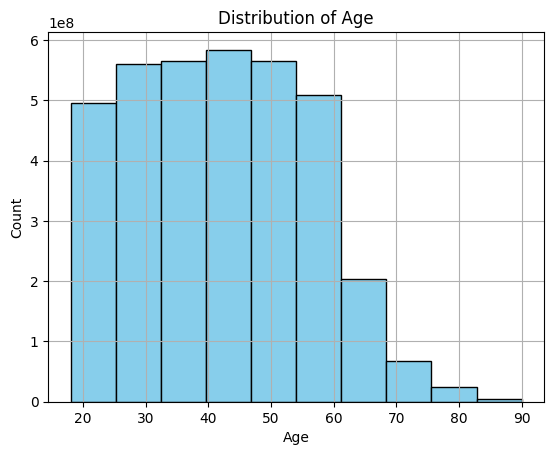

In [ ]:
# Plot histogram using weighted count
#plt.figure(figsize=(10, 6))
plt.hist(df['AGE'], bins=10, weights=df['WEIGHT'], color='skyblue', edgecolor='black')
plt.title("Distribution of Age")
plt.xlabel("Age")
plt.ylabel("Count")
plt.grid(True)
plt.show()


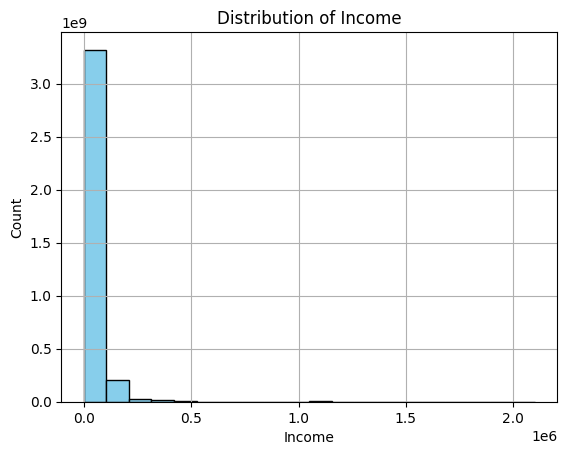

In [ ]:
# Plot histogram using weighted count
#plt.figure(figsize=(10, 6))
plt.hist(df['INCWAGE'], bins=20, weights=df['WEIGHT'], color='skyblue', edgecolor='black')
plt.title("Distribution of Income")
plt.xlabel("Income")
plt.ylabel("Count")
plt.grid(True)
plt.show()


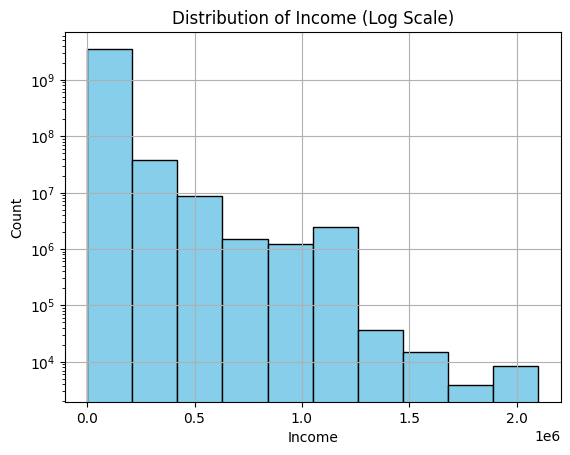

In [ ]:
plt.hist(df['INCWAGE'], bins=10, weights=df['WEIGHT'], color='skyblue', edgecolor='black', log=True)
plt.title("Distribution of Income (Log Scale)")
plt.xlabel("Income")
plt.ylabel("Count")
plt.grid(True)
plt.show()

In [ ]:
"""
# Define a function for creating labeled countplots
def labeled_countplot_unweighted(data, column, labels=None, xlabel=None, ylabel=None, title=None, orientation='vertical'):
    if labels:
        data[column] = data[column].map(labels)

    if orientation == 'vertical':
        sns.countplot(x=column, data=data, order=data[column].value_counts().index, color=sns.color_palette()[0])
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
    elif orientation == 'horizontal':
        sns.countplot(y=column, data=data, order=data[column].value_counts().index, color=sns.color_palette()[0])
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)

    plt.title(title)
    plt.show()
"""

In [ ]:
def labeled_countplot(data, column, labels=None, xlabel=None, ylabel=None, title=None, orientation='vertical'):
    if labels:
        data[column] = data[column].map(labels)
    weight_column='WEIGHT'

    # Calculate weighted counts
    weighted_counts = data.groupby([column])[weight_column].sum().reset_index()

    # Sort the DataFrame based on weighted counts
    sorted_counts = weighted_counts.sort_values(by=[weight_column], ascending=False)

    #sns.barplot(x=column, y=weight_column, hue='SEX', data=sorted_counts, palette={1: 'teal', 2: '#c38ecd'}, hue_order=[1, 2])

    if orientation == 'vertical':
        sns.barplot(x=column, y=weight_column, data=sorted_counts, color='skyblue', edgecolor='black')
        plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
    elif orientation == 'horizontal':
        sns.barplot(y=column, x=weight_column, data=sorted_counts, color='skyblue', edgecolor='black')
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)

    plt.title(title)
    plt.show()

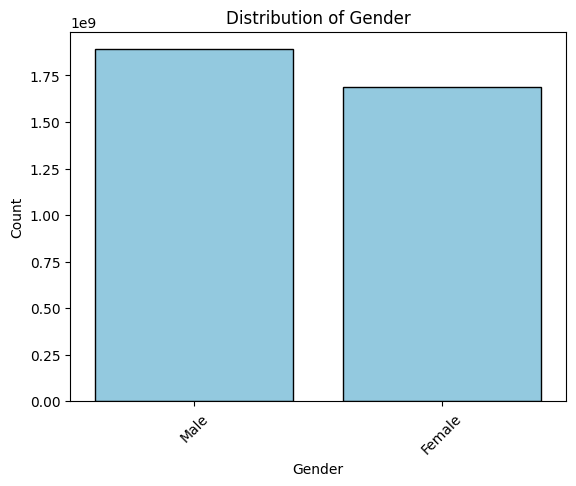

In [ ]:
# Create a copy of the original DataFrame for visualization
df_labelled = df.copy()

# Create labeled countplots
labeled_countplot(df_labelled, 'SEX',  sex_labels, 'Gender', 'Count', 'Distribution of Gender')

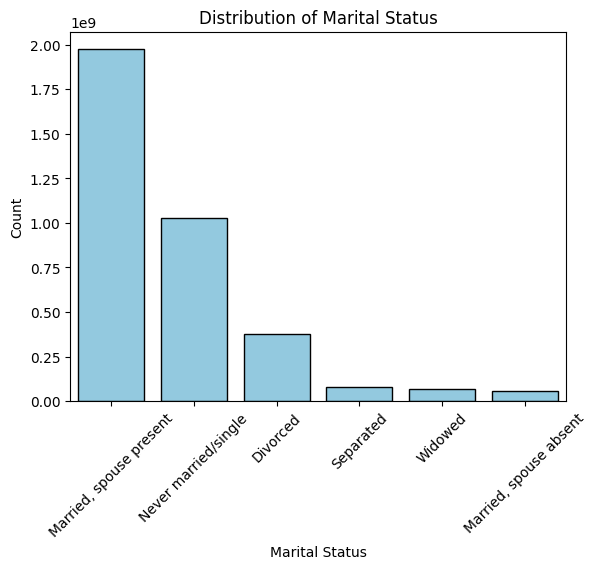

In [ ]:
labeled_countplot(df_labelled, 'MARST', marst_labels.set_index('Code').to_dict()['Label'], 'Marital Status', 'Count', 'Distribution of Marital Status')

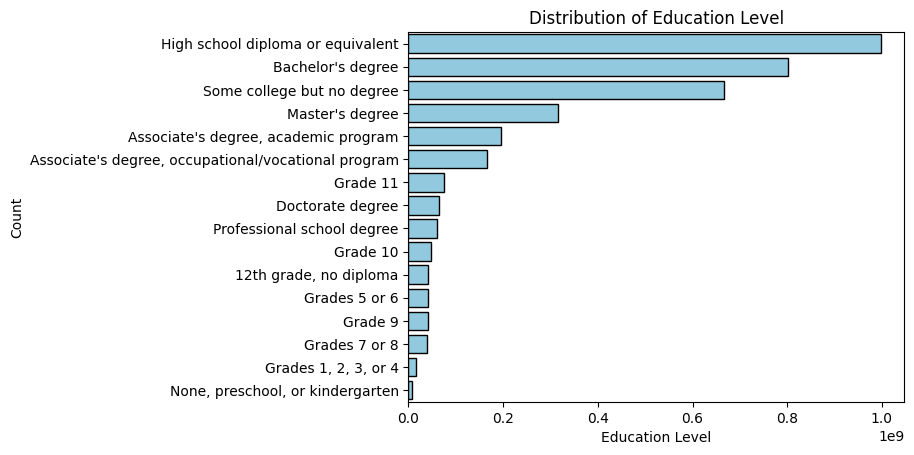

In [ ]:
labeled_countplot(df_labelled, 'EDUC', educ_labels.set_index('Code').to_dict()['Label'], 'Education Level', 'Count', 'Distribution of Education Level', "horizontal")

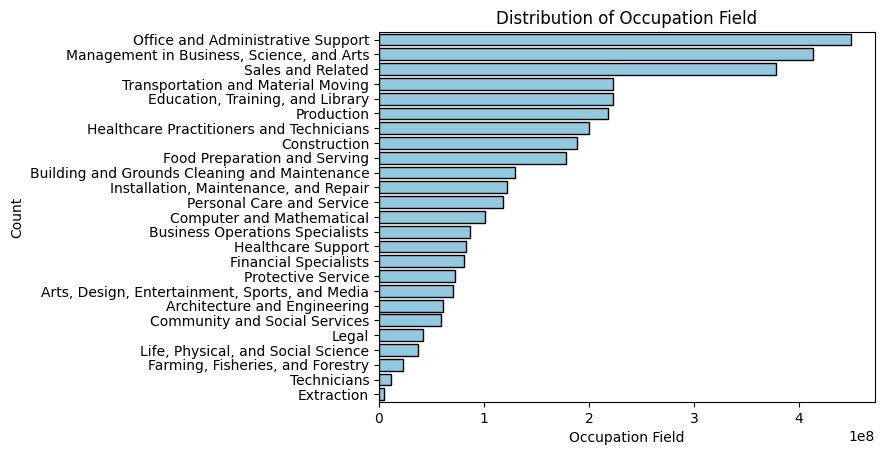

In [ ]:
labeled_countplot(df_labelled, 'OCC_FIELD', None, 'Occupation Field', 'Count', 'Distribution of Occupation Field', "horizontal")

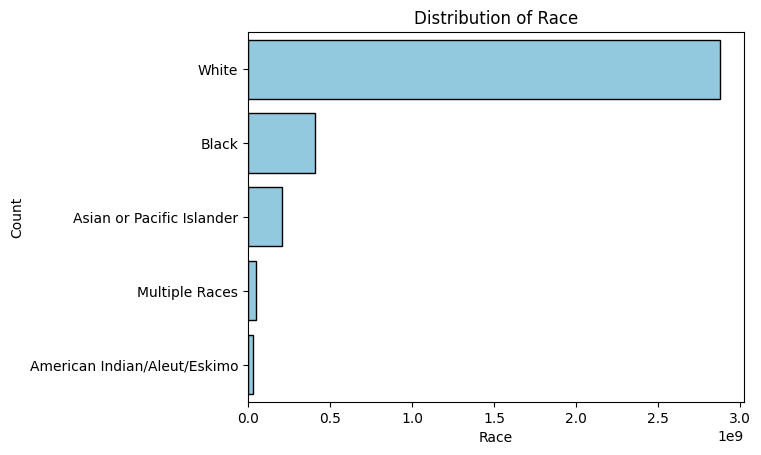

In [ ]:
labeled_countplot(df_labelled, 'RACE_GROUP', None, 'Race', 'Count', 'Distribution of Race', "horizontal")

<ipython-input-36-0f2c9600be6c>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


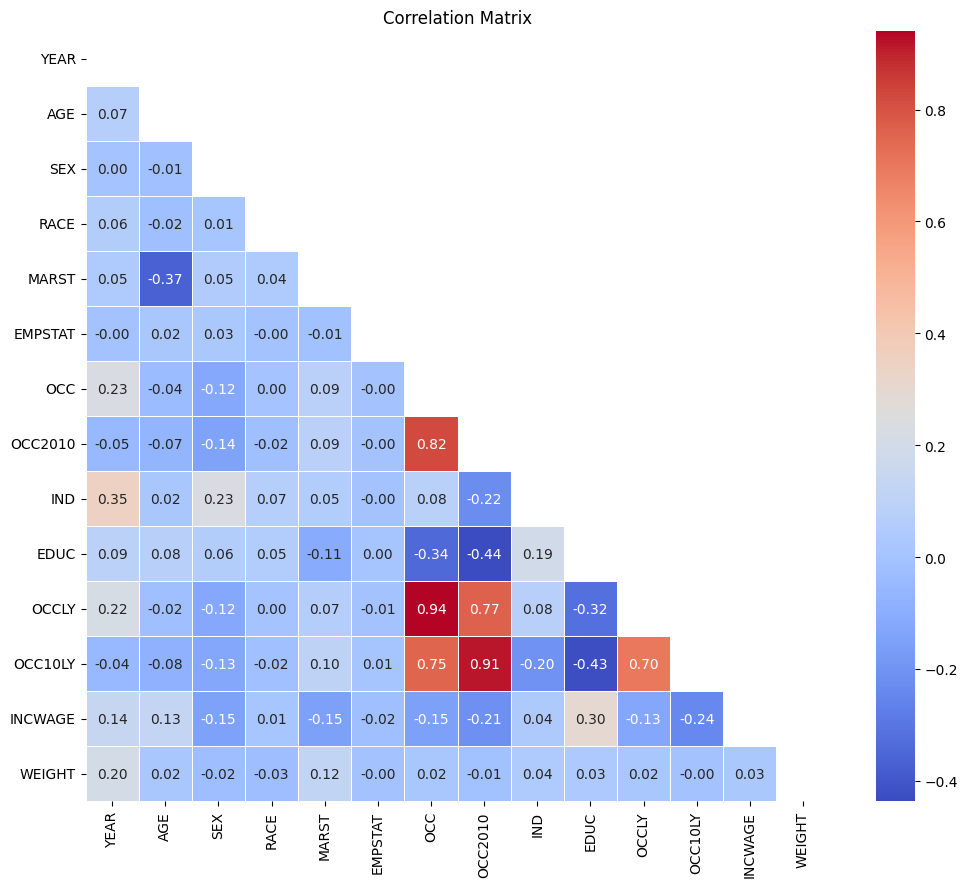

In [ ]:
# Generate correlation matrix
correlation_matrix = df.corr()

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Plot heatmap of the lower triangle of the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()


## EDA by Gender

In [ ]:
# Create a copy of the original DataFrame for visualization
df_gender = df.copy()

### General

In [ ]:
"""
# Define a function for creating side-by-side countplots
def side_by_side_countplot_unweighted(data, column, labels=None, xlabel=None, ylabel=None, title=None):
    plt.figure(figsize=(12, 4))

    if labels:
      data = data.copy()
      data.loc[:, column] = data[column].map(labels)

    sns.countplot(x=column, hue='SEX', data=data, order=data[column].value_counts().index, palette={1: 'teal', 2: '#c38ecd'})
    plt.xticks(rotation=80)

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend(title='Gender', labels=['Male', 'Female'])

    plt.show()
"""

In [ ]:
def side_by_side_countplot(data, column, labels=None, xlabel=None, ylabel=None, title=None):
    plt.figure(figsize=(12, 4))
    weight_column='WEIGHT'

    if labels:
        data = data.copy()
        data.loc[:, column] = data[column].map(labels)

    # Calculate weighted counts
    weighted_counts = data.groupby([column, 'SEX'])[weight_column].sum().reset_index()

    # Sort the DataFrame based on weighted counts
    sorted_counts = weighted_counts.sort_values(by=[weight_column], ascending=False)

    sns.barplot(x=column, y=weight_column, hue='SEX', data=sorted_counts, palette={1: 'teal', 2: '#c38ecd'}, hue_order=[1, 2])
    plt.xticks(rotation=80)

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    # Create custom legend with colors
    male_patch = mpatches.Patch(color='teal', label='Male')
    female_patch = mpatches.Patch(color='#c38ecd', label='Female')
    plt.legend(handles=[male_patch, female_patch], title='Gender', loc='upper right')

    plt.show()

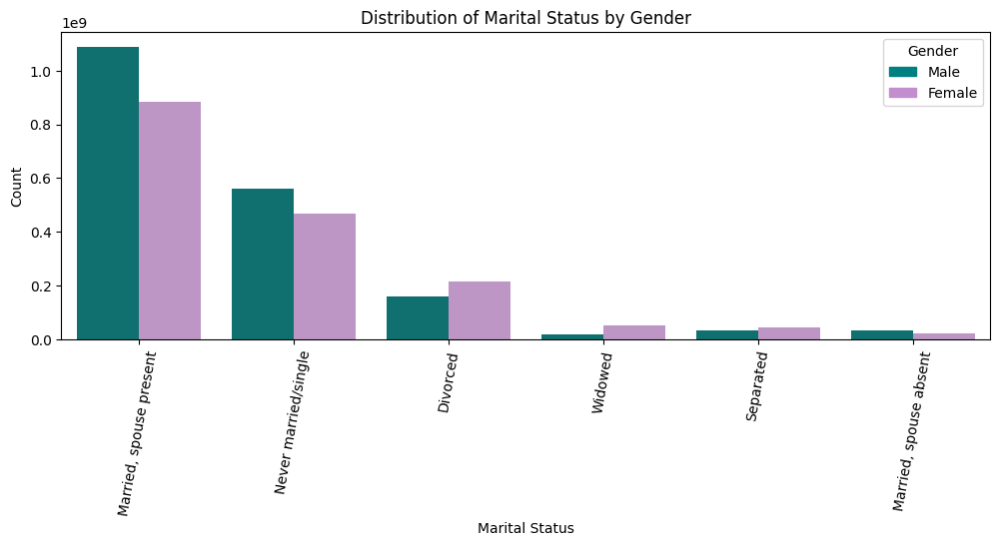

In [ ]:
# Create side-by-side countplots for selected variables
side_by_side_countplot(df_gender, 'MARST', marst_labels.set_index('Code').to_dict()['Label'], 'Marital Status', 'Count', 'Distribution of Marital Status by Gender')

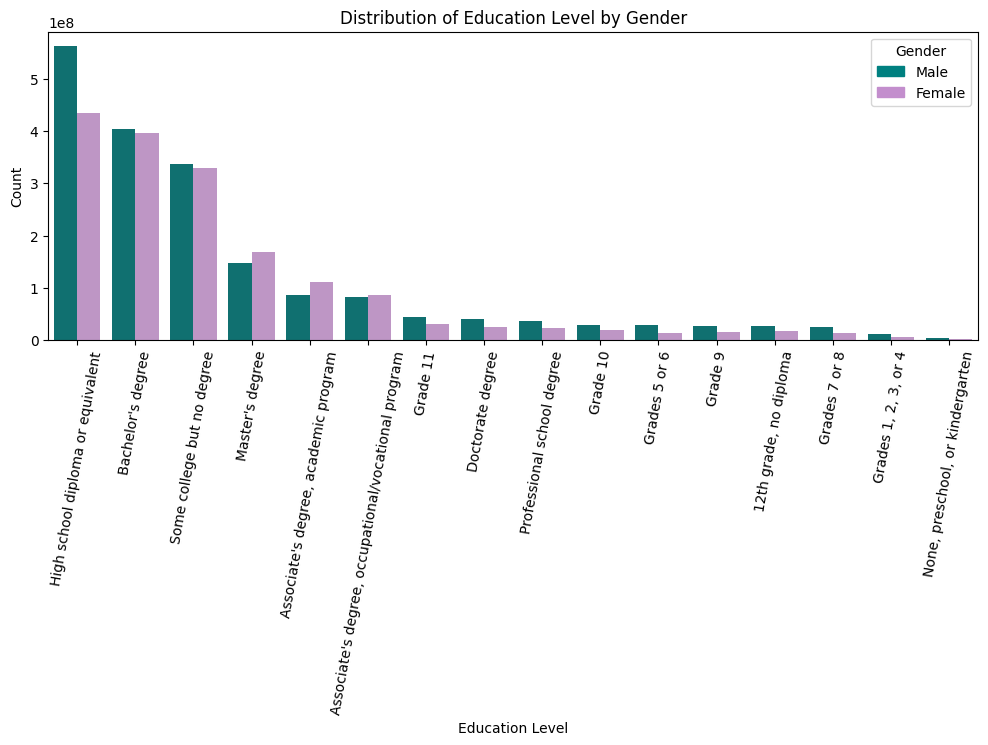

In [ ]:
side_by_side_countplot(df_gender, 'EDUC', educ_labels.set_index('Code').to_dict()['Label'], 'Education Level', 'Count', 'Distribution of Education Level by Gender')

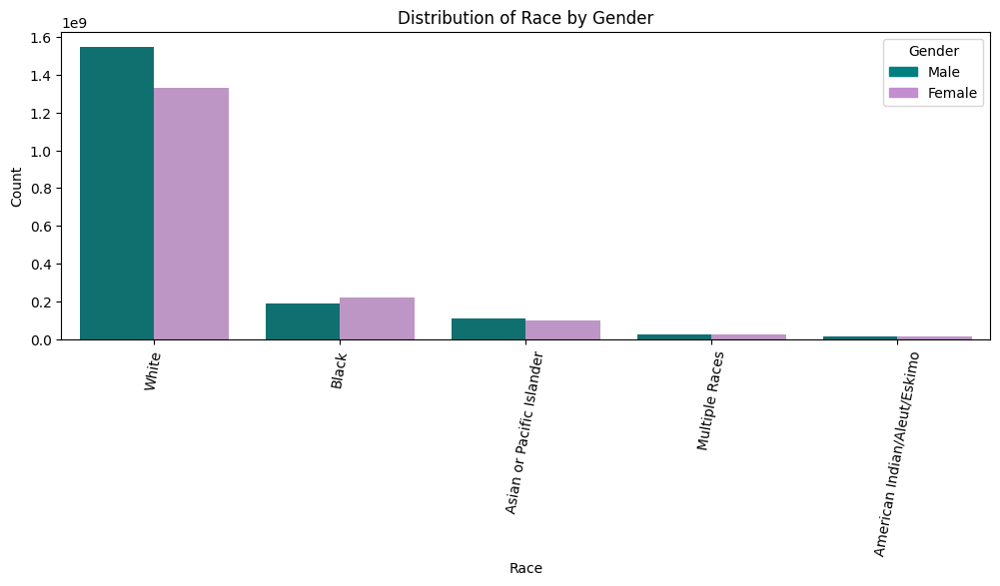

In [ ]:
side_by_side_countplot(df_gender, 'RACE_GROUP', None, 'Race', 'Count', 'Distribution of Race by Gender')

### Focus on Occupation

#### **Q1: Is there a significant association between gender and occupational field?**

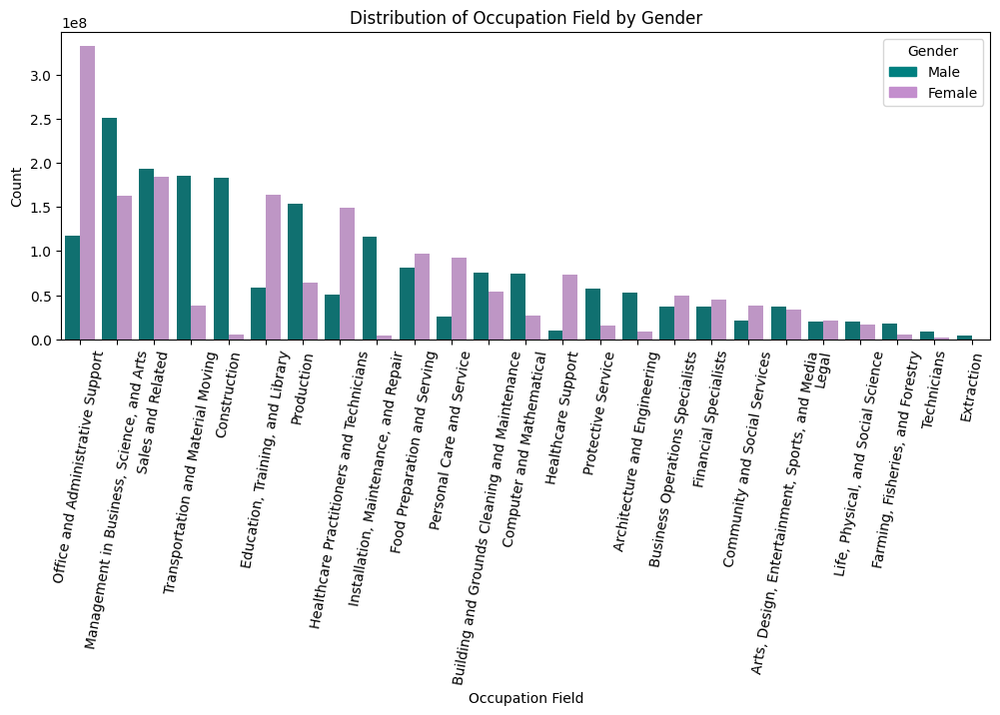

In [ ]:
side_by_side_countplot(df_gender, 'OCC_FIELD', None, 'Occupation Field', 'Count', 'Distribution of Occupation Field by Gender')

In [ ]:
# Calculate weighted overall male to female ratio
male_weighted_sum = (df_gender['SEX'] == 1).astype(int).multiply(df_gender['WEIGHT']).sum()
female_weighted_sum = (df_gender['SEX'] == 2).astype(int).multiply(df_gender['WEIGHT']).sum()
overall_male_to_female_ratio_weighted = male_weighted_sum / female_weighted_sum

# Print weighted overall male to female ratio
print("Weighted Overall Male to Female Ratio:", round(overall_male_to_female_ratio_weighted, 2))

# Calculate weighted male and female frequencies for each occupation field
weighted_male_freq = df_gender[df_gender['SEX'] == 1].groupby('OCC_FIELD')['WEIGHT'].sum()
weighted_female_freq = df_gender[df_gender['SEX'] == 2].groupby('OCC_FIELD')['WEIGHT'].sum()

# Calculate the male to female ratio for each occupation field
male_to_female_ratio = weighted_male_freq / weighted_female_freq

# Print the male to female ratio for each occupation field
print("Male to Female Ratio for each Occupation Field:")
print(male_to_female_ratio)

Weighted Overall Male to Female Ratio: 1.12
Male to Female Ratio for each Occupation Field:
OCC_FIELD
Architecture and Engineering                       6.039177
Arts, Design, Entertainment, Sports, and Media     1.095248
Building and Grounds Cleaning and Maintenance      1.379565
Business Operations Specialists                    0.754908
Community and Social Services                      0.558761
Computer and Mathematical                          2.773931
Construction                                      33.372502
Education, Training, and Library                   0.357244
Extraction                                        38.301944
Farming, Fisheries, and Forestry                   3.460806
Financial Specialists                              0.818020
Food Preparation and Serving                       0.831060
Healthcare Practitioners and Technicians           0.336856
Healthcare Support                                 0.131912
Installation, Maintenance, and Repair             24.10232

In [ ]:
# Sort the male_to_female_ratio Series in descending order
sorted_ratios = male_to_female_ratio.sort_values(ascending=False)

# Define a function to classify dominance based on sorted ratios
def classify_dominance_sorted(ratio):
    if ratio > 1.2:
        return 'Male-dominated'
    elif ratio < 0.8:
        return 'Female-dominated'
    else:
        return 'Balanced'

# Apply dominance classification to each occupation field
field_classification_sorted = sorted_ratios.apply(classify_dominance_sorted)

# Print the classification for each occupation field
print("Occupation Field Classification:")
print(field_classification_sorted)


Occupation Field Classification:
OCC_FIELD
Extraction                                          Male-dominated
Construction                                        Male-dominated
Installation, Maintenance, and Repair               Male-dominated
Architecture and Engineering                        Male-dominated
Transportation and Material Moving                  Male-dominated
Technicians                                         Male-dominated
Protective Service                                  Male-dominated
Farming, Fisheries, and Forestry                    Male-dominated
Computer and Mathematical                           Male-dominated
Production                                          Male-dominated
Management in Business, Science, and Arts           Male-dominated
Building and Grounds Cleaning and Maintenance       Male-dominated
Life, Physical, and Social Science                  Male-dominated
Arts, Design, Entertainment, Sports, and Media            Balanced
Sales and Related  

In [ ]:
# Group the data by OCC_FIELD and SEX and count the occurrences
frequencies = df.groupby(['OCC_FIELD', 'SEX']).size().unstack(fill_value=0)

# Perform chi-square test for independence
chi2, p, dof, expected = chi2_contingency(frequencies)

# Print the test statistic and p-value
print("Chi-square statistic:", chi2)
print("p-value:", p)

# Set significance level
alpha = 0.05

# Compare p-value with significance level
if p < alpha:
    print("Reject the null hypothesis: There is a significant association between gender and occupational field.")
else:
    print("Fail to reject the null hypothesis: There is no significant association between gender and occupational field.")


Chi-square statistic: 491089.24088776245
p-value: 0.0
Reject the null hypothesis: There is a significant association between gender and occupational field.


Weighted version

In [ ]:
# Group the data by OCC_FIELD and SEX and sum the weighted counts
weighted_frequencies = df.groupby(['OCC_FIELD', 'SEX'])['WEIGHT'].sum().unstack(fill_value=0)

# Calculate the expected frequencies with weights
expected_frequencies = weighted_frequencies.copy()
for col in expected_frequencies.columns:
    expected_frequencies[col] = expected_frequencies[col].sum() * expected_frequencies[col] / expected_frequencies[col].sum()

# Perform chi-square test for independence
chi2, p = chi2_contingency(weighted_frequencies, correction=False)[:2]

# Print the test statistic and p-value
print("Chi-square statistic:", chi2)
print("p-value:", p)

# Set significance level
alpha = 0.05

# Compare p-value with significance level
if p < alpha:
    print("Reject the null hypothesis: There is a significant association between gender and occupational field.")
else:
    print("Fail to reject the null hypothesis: There is no significant association between gender and occupational field.")


Chi-square statistic: 808742972.9385037
p-value: 0.0
Reject the null hypothesis: There is a significant association between gender and occupational field.


In [ ]:
# Create a dictionary to store the test results
test_results = {
    "Chi-square statistic": chi2,
    "p-value": p,
}

# Specify the file path
file_path = "IntermediaryResults/tests/chi_square_test_results_gender_occ_field.json"

# Save the test results to a JSON file
with open(file_path, "w") as json_file:
    json.dump(test_results, json_file, indent=4)

#### **Q2: Is there a significant association between gender representation and years within each occupation field?"**

In [ ]:
# Define a function for creating line plots for each occupation field
def lineplot_by_occ_field(data, occ_field, title=None):
    #plt.figure(figsize=(12, 6))

    sns.lineplot(x='YEAR', y='count', hue='SEX', data=data, palette={"Male": 'teal', "Female": '#c38ecd'})
    plt.title(title)
    plt.xlabel("Year")
    plt.ylabel("Count")
    plt.legend(title='Gender')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

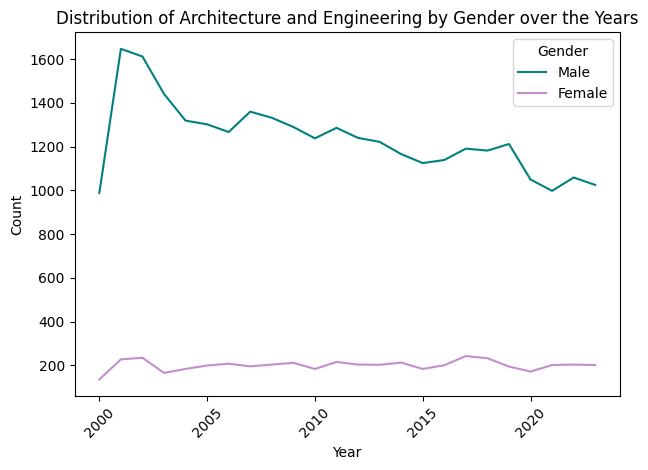

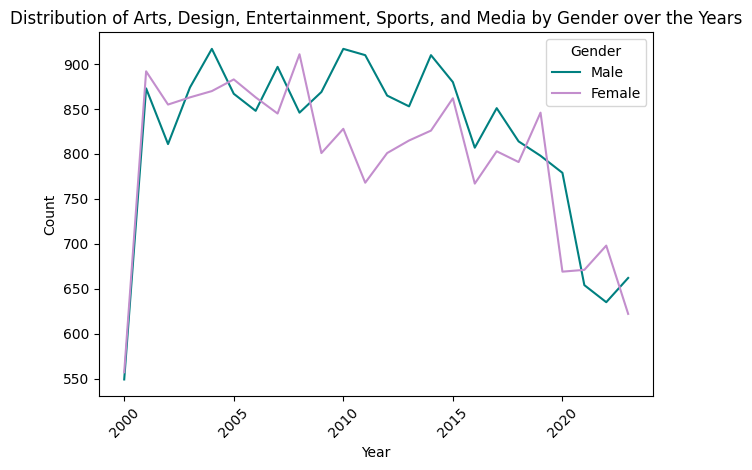

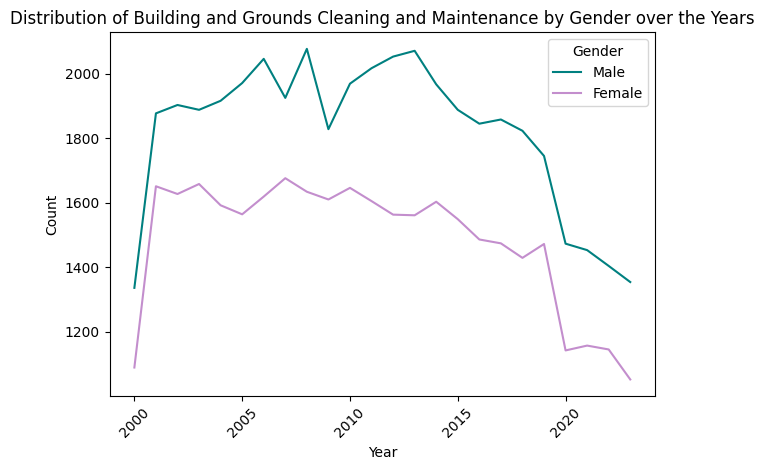

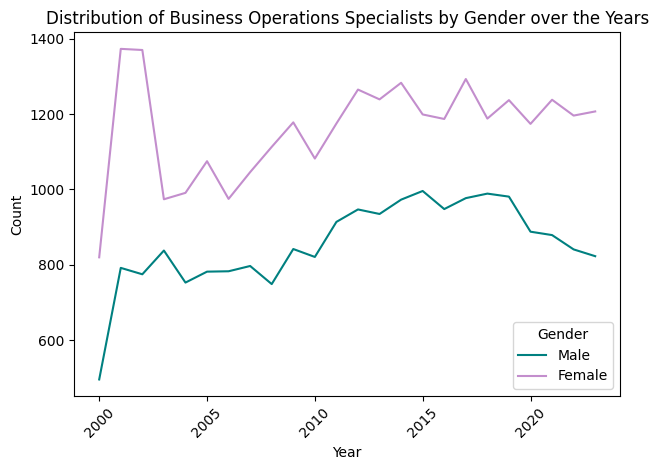

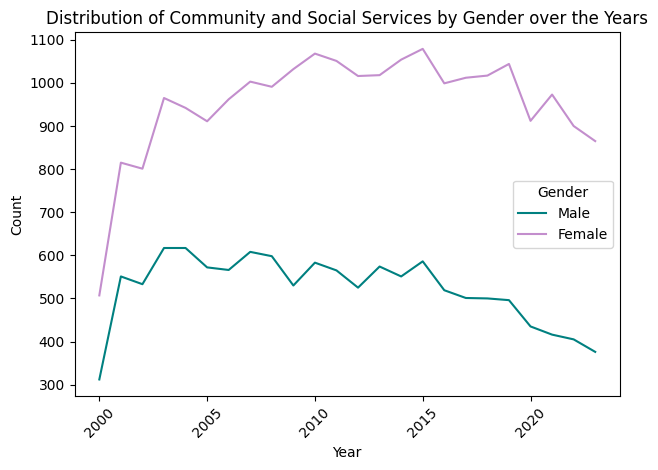

...

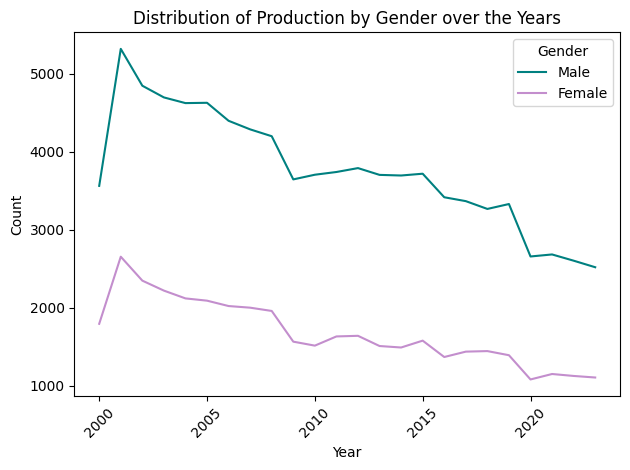

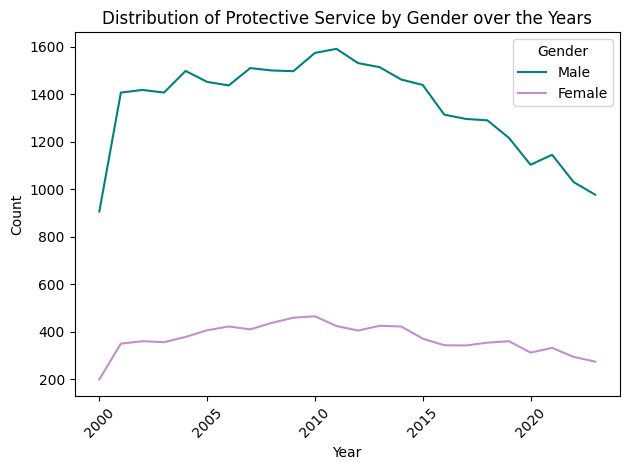

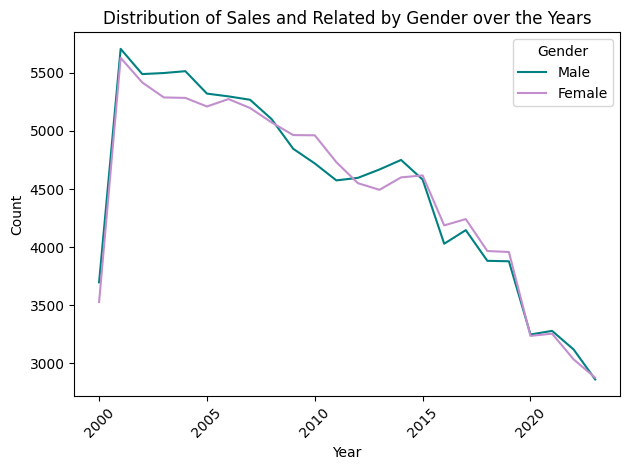

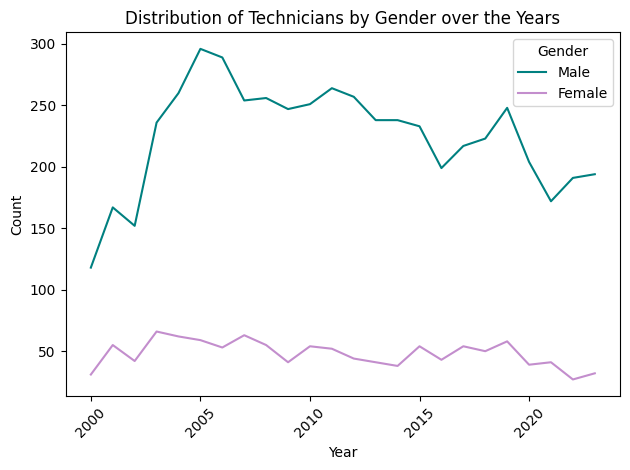

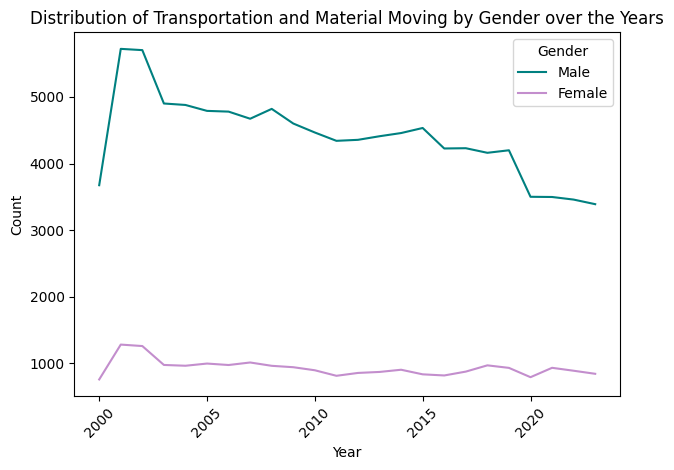

In [ ]:
# Group data by occupation field, year, and gender and count occurrences
df_grouped = df_gender.groupby(['OCC_FIELD', 'YEAR', 'SEX']).size().reset_index(name='count')
# Map gender labels
gender_labels = {1: 'Male', 2: 'Female'}
df_grouped['SEX'] = df_grouped['SEX'].map(gender_labels)

# Plot line graphs for each occupation field
for occ_field in df_grouped['OCC_FIELD'].unique():
    lineplot_by_occ_field(df_grouped[df_grouped['OCC_FIELD'] == occ_field], occ_field, f'Distribution of {occ_field} by Gender over the Years')

Weighted version on a single plot

In [ ]:
def lineplot_by_occ_field(data, x, y, hue, **kwargs):
    sns.lineplot(data=data, x=x, y=y, hue=hue, palette={"Male": 'teal', "Female": '#c38ecd'}, **kwargs)
    plt.title(data['OCC_FIELD'].iloc[0])
    plt.xlabel("Year")
    plt.ylabel("Weighted Count")
    plt.legend(title='Gender')
    plt.xticks(rotation=45)
    plt.tight_layout()

# Group data by occupation field, year, and gender and calculate weighted counts
df_grouped = df.groupby(['OCC_FIELD', 'YEAR', 'SEX'])["WEIGHT"].sum().reset_index(name='weighted_count')
# Map gender labels
gender_labels = {1: 'Male', 2: 'Female'}
df_grouped['SEX'] = df_grouped['SEX'].map(gender_labels)

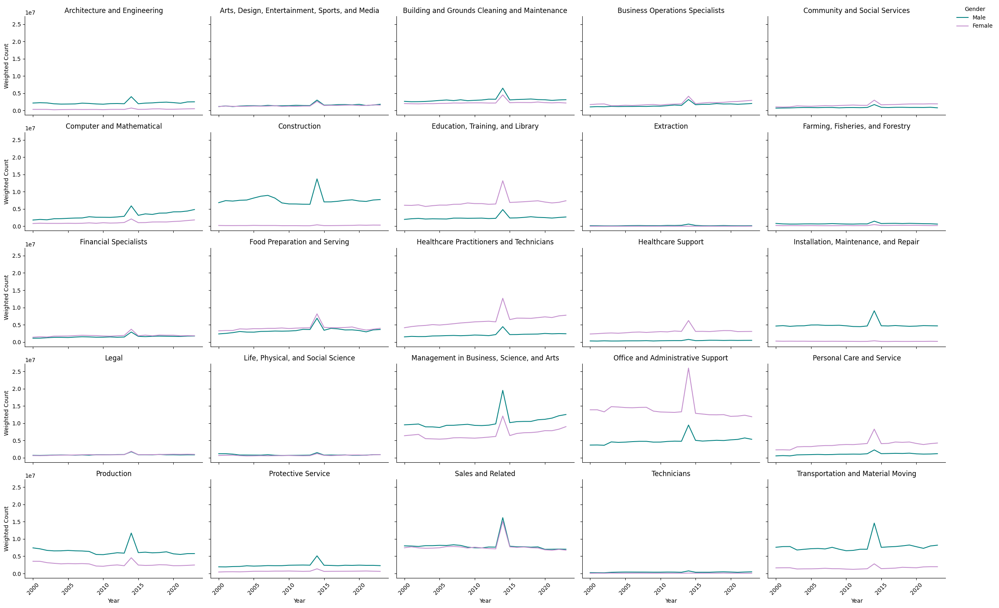

In [ ]:
# Plot line graphs for each occupation field
g = sns.FacetGrid(df_grouped, col='OCC_FIELD', col_wrap=5, aspect=1.5)
g.map_dataframe(lineplot_by_occ_field, x='YEAR', y='weighted_count', hue='SEX')
g.set_xlabels('Year')
g.set_ylabels('Weighted Count')
g.add_legend(title='Gender', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()


#### **Connection with Education**

##### **Q3: Is there an association between gender representation and education attainment within each occupation field?**

In [ ]:
# Iterate over unique values of 'OCC_FIELD' and create countplots for each one
for occ_field in df_gender['OCC_FIELD'].unique():
    data_occ_field = df_gender[df_gender['OCC_FIELD'] == occ_field]
    title = f'Distribution of Education Level by Gender for Occupation Field: {occ_field}'
    side_by_side_countplot(data_occ_field, 'EDUC', educ_labels.set_index('Code').to_dict()['Label'], 'Education Level', 'Count', title)


Output hidden; open in https://colab.research.google.com to view.

In the plots, we noticed that for different occupation fields the highest educational degrees that most of the people hold is different. Let's see if that difference is statistically significant.

##### **Q4: Is there a significant association between education attainment and occupation field?**

In [ ]:
# Create a contingency table
contingency_table = pd.pivot_table(df, values='SEX', index='EDUC', columns='OCC_FIELD', aggfunc='count', fill_value=0)

# Perform chi-square test for independence
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Print the test statistic and p-value
print("Chi-square statistic:", chi2)
print("p-value:", p)

# Set significance level
alpha = 0.05

# Compare p-value with significance level
if p < alpha:
    print("Reject the null hypothesis: There is a significant association between education and occupation.")
else:
    print("Fail to reject the null hypothesis: There is no significant association between education and occupation.")


Chi-square statistic: 1377863.5436697965
p-value: 0.0
Reject the null hypothesis: There is a significant association between education and occupation.


#### **Connection with Marital Status**

##### **Q6: Is there an association between gender representation and marital status within each occupation field?**

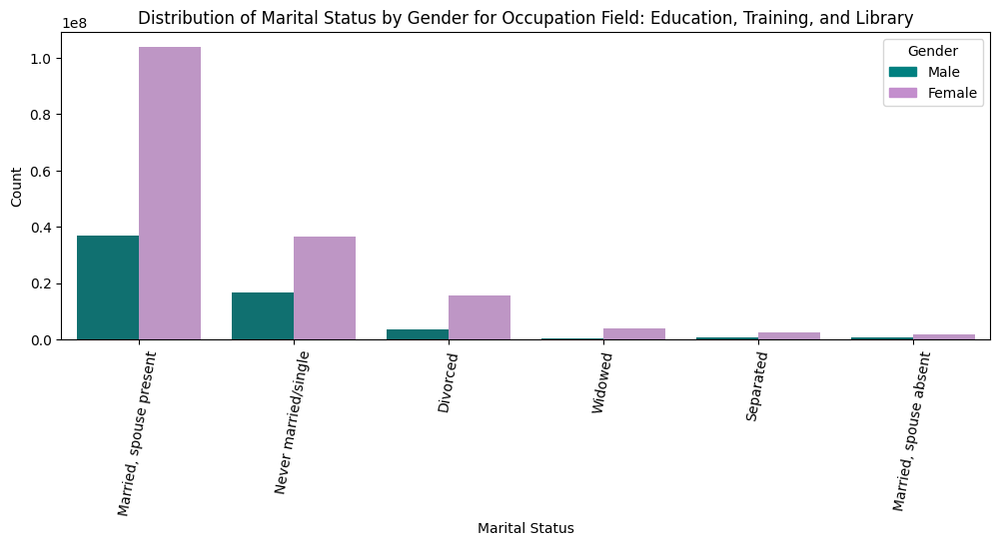

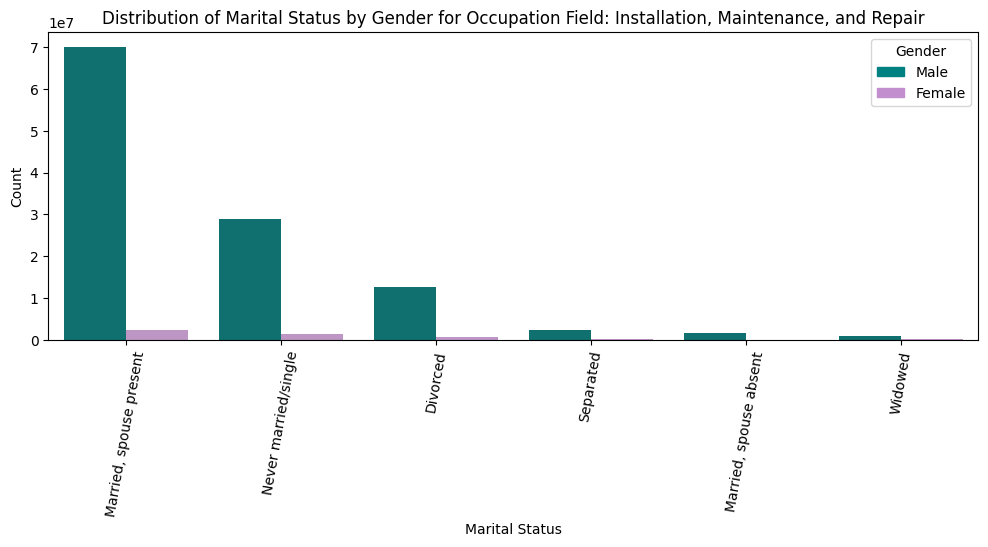

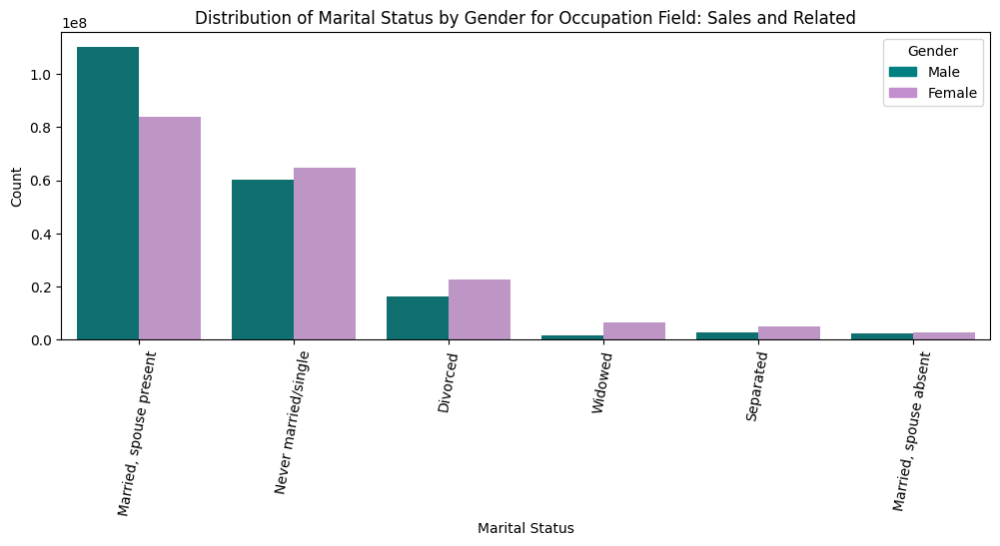

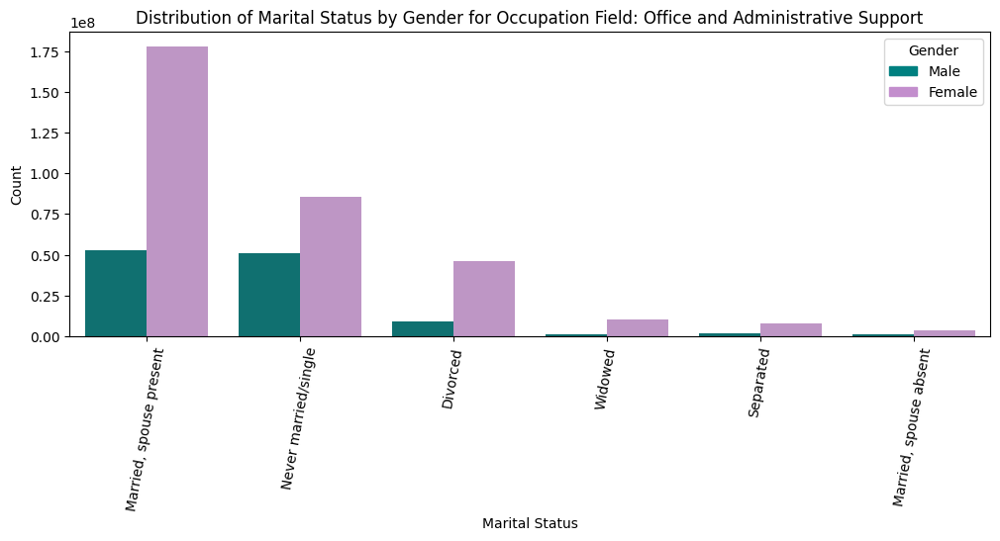

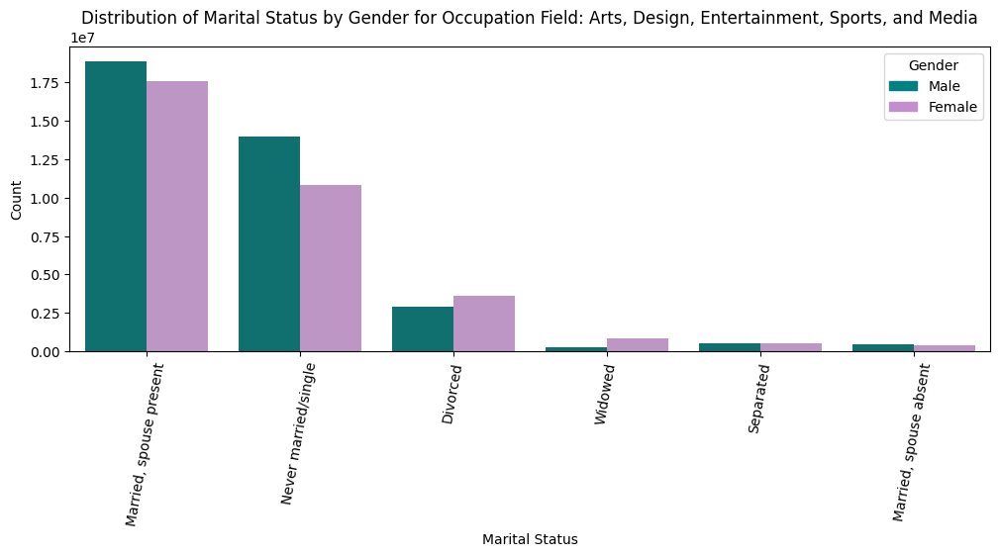

...

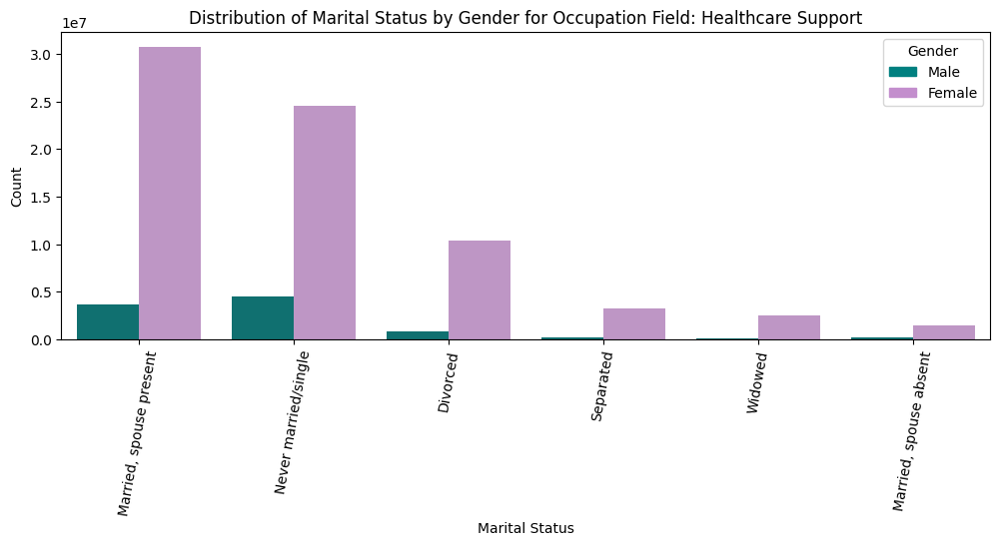

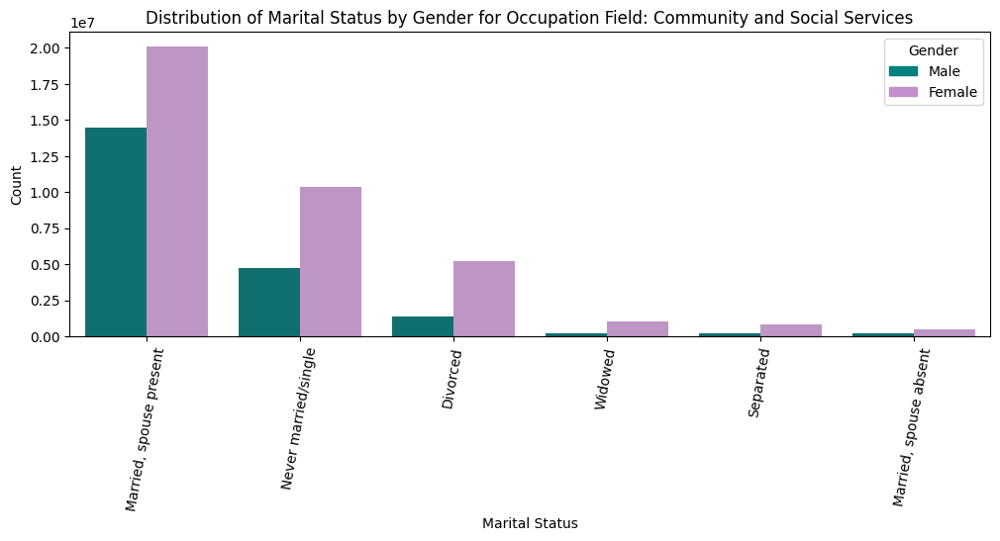

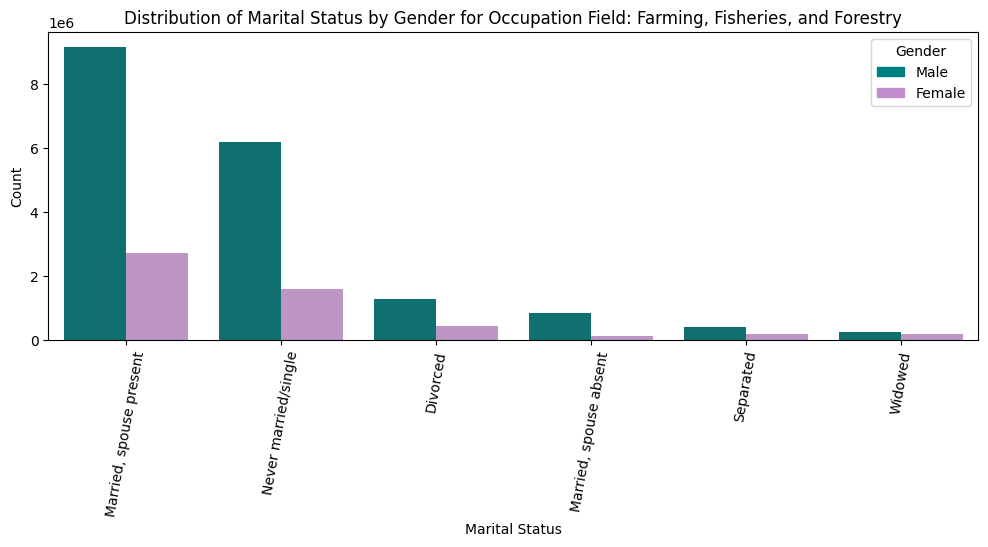

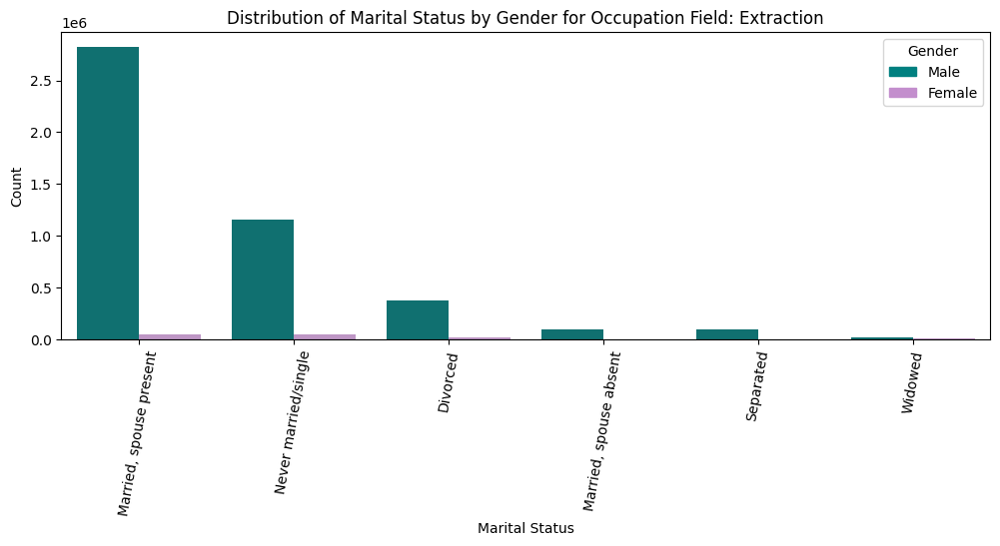

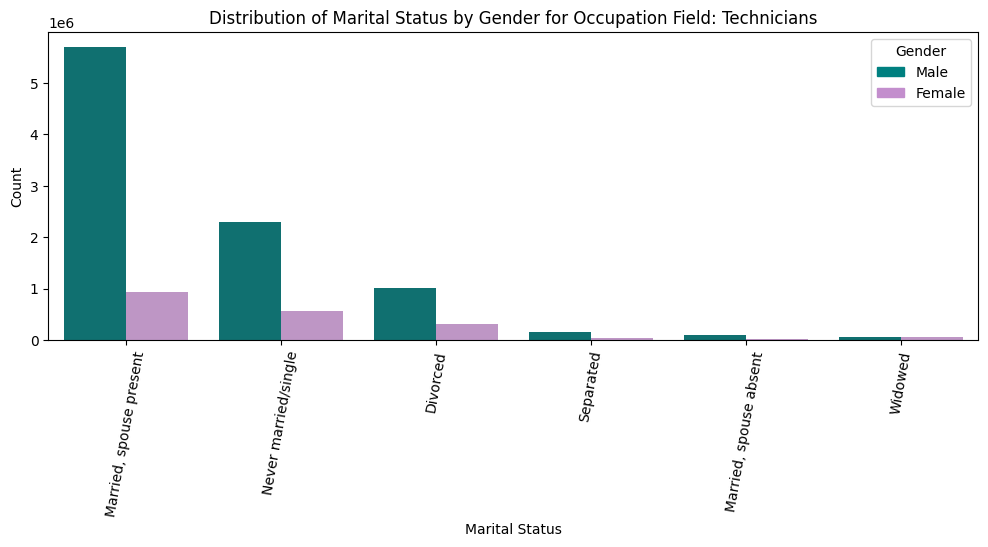

In [ ]:
# Iterate over unique values of 'OCC_FIELD' and create countplots for each one
for occ_field in df_gender['OCC_FIELD'].unique():
    data_occ_field = df_gender[df_gender['OCC_FIELD'] == occ_field]
    title = f'Distribution of Marital Status by Gender for Occupation Field: {occ_field}'
    side_by_side_countplot(data_occ_field, 'MARST', marst_labels.set_index('Code').to_dict()['Label'], 'Marital Status', 'Count', title)



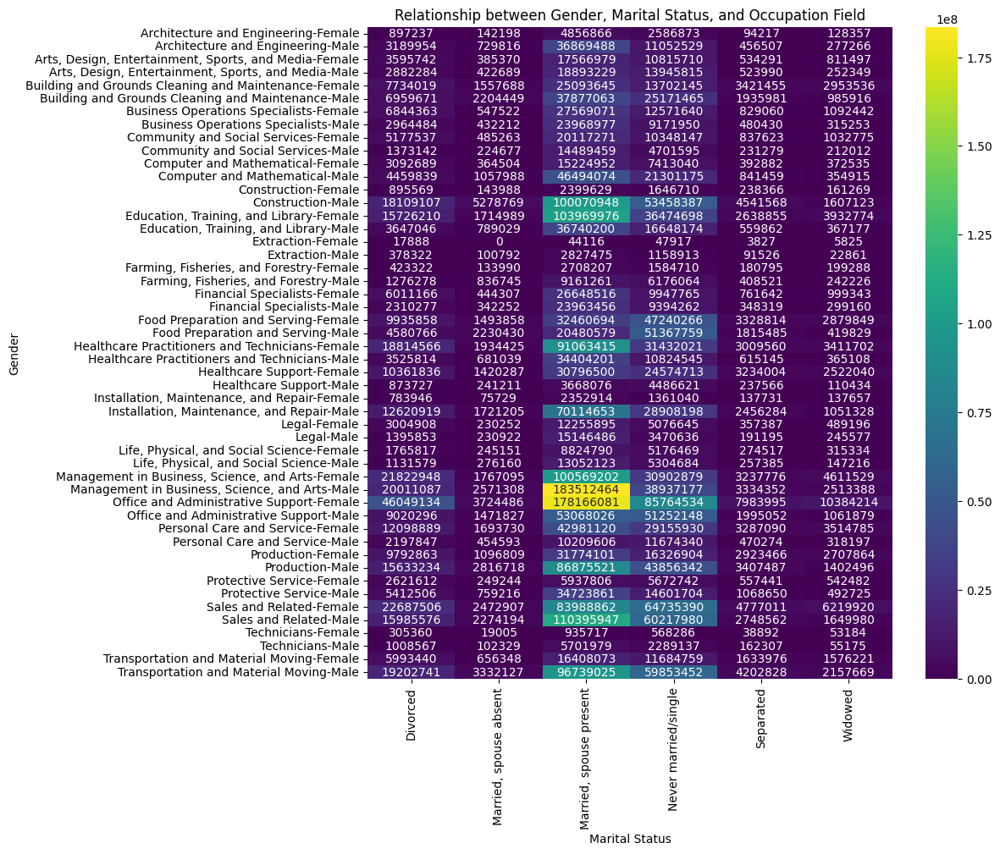

In [ ]:
# Create a copy of the original DataFrame for visualization
df_gender_copy = df_gender.copy()

# Map labels
marst_mapping = dict(zip(marst_labels['Code'], marst_labels['Label']))
df_gender_copy['MARST_Label'] = df_gender_copy['MARST'].map(marst_mapping)
df_gender_copy['SEX_Label'] = df_gender_copy['SEX'].map(sex_labels)
# Merge df_gender_copy with educ_labels on 'EDUC' and 'Code'
df_gender_copy = df_gender_copy.merge(educ_labels, left_on='EDUC', right_on='Code', how='left')
df_gender_copy.drop(columns='Code', inplace=True)
df_gender_copy.rename(columns={'Label': 'EDUC_Label'}, inplace=True)

# Create a weighted contingency table
contingency_table = df_gender_copy.groupby(['OCC_FIELD', 'SEX_Label', 'MARST_Label'])['WEIGHT'].sum().unstack(fill_value=0)

# Plot the heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(contingency_table, cmap='viridis', annot=True, fmt='.0f', cbar=True)
plt.title('Relationship between Gender, Marital Status, and Occupation Field')
plt.xlabel('Marital Status')
plt.ylabel('Gender')

plt.show()

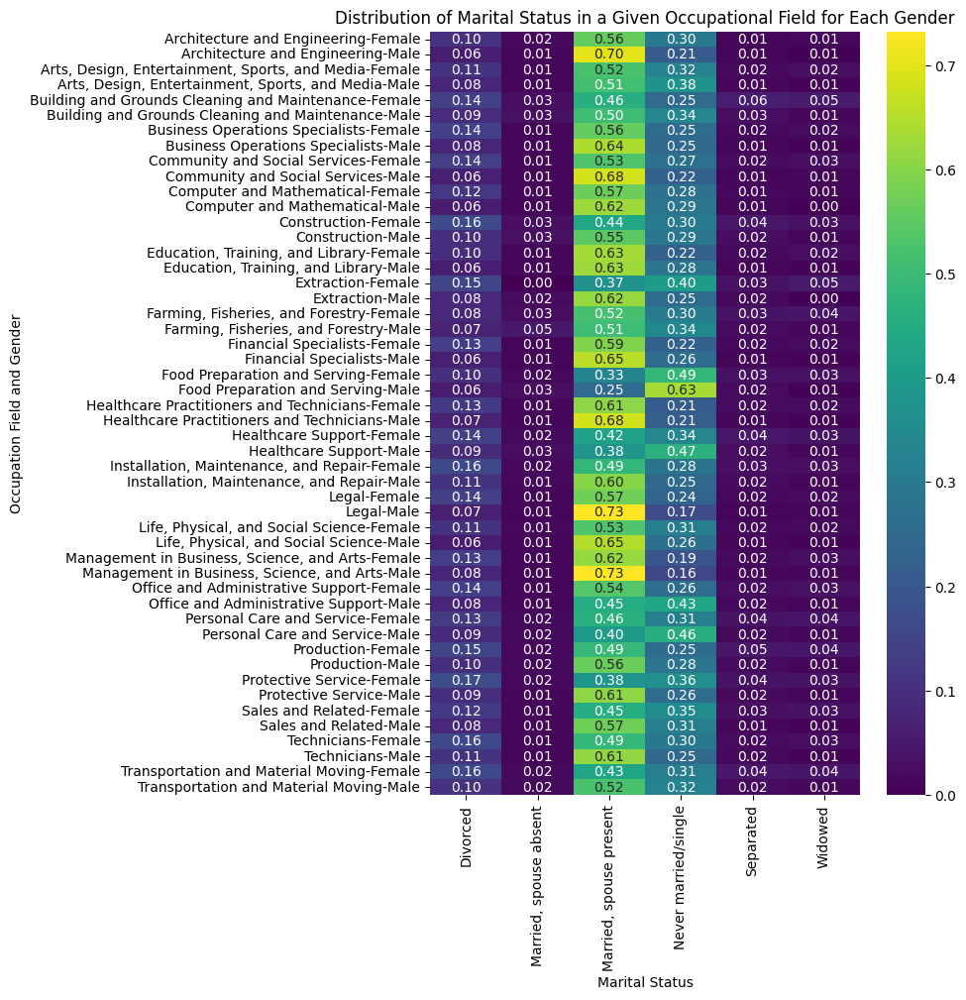

In [ ]:
# Calculate row-wise sums for each occupation field
row_sums = contingency_table.sum(axis=1)

# Divide each element in the contingency table by the corresponding row sum to get ratios
contingency_table_ratios = contingency_table.div(row_sums, axis=0)

# Plot the heatmap
plt.figure(figsize=(7, 10))
sns.heatmap(contingency_table_ratios, cmap='viridis', annot=True, fmt='.2f', cbar=True)
plt.title('Distribution of Marital Status in a Given Occupational Field for Each Gender')
plt.xlabel('Marital Status')
plt.ylabel('Occupation Field and Gender')

plt.show()

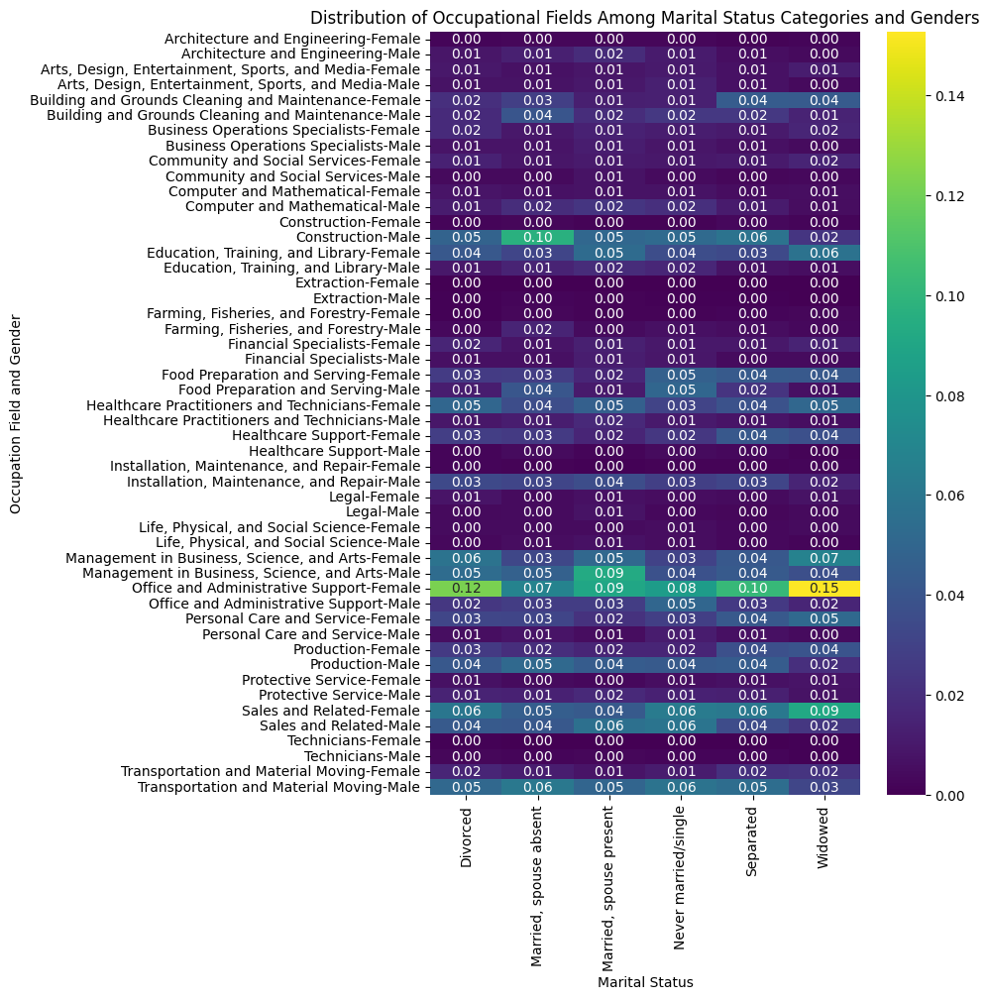

In [ ]:
# Calculate row-wise sums for each occupation field
row_sums = contingency_table.sum(axis=0)

# Divide each element in the contingency table by the corresponding row sum to get ratios
contingency_table_ratios = contingency_table.div(row_sums, axis=1)

# Plot the heatmap
plt.figure(figsize=(7, 10))
sns.heatmap(contingency_table_ratios, cmap='viridis', annot=True, fmt='.2f', cbar=True)
plt.title('Distribution of Occupational Fields Among Marital Status Categories and Genders')
plt.xlabel('Marital Status')
plt.ylabel('Occupation Field and Gender')

plt.show()


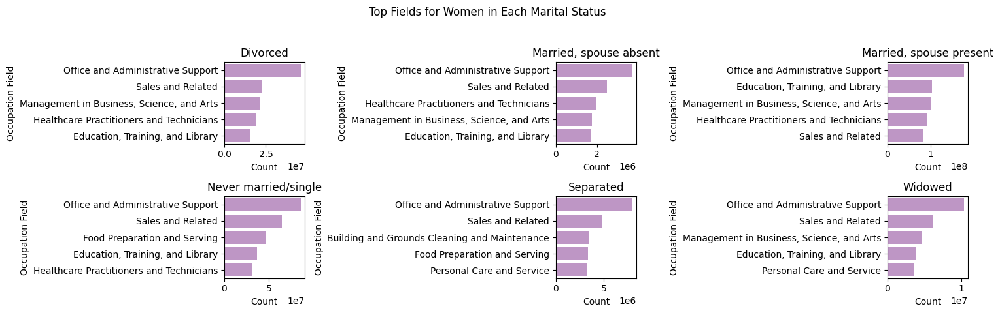

In [ ]:
# Filter the data for females
female_data = df_gender_copy[df_gender_copy['SEX_Label'] == 'Female']

# Group the data by marital status and occupation field, summing the weighted counts
grouped_data = female_data.groupby(['MARST_Label', 'OCC_FIELD'])['WEIGHT'].sum().reset_index()

# Get the top fields that women like to work in for each marital status
top_fields_per_marital_status = grouped_data.groupby('MARST_Label').apply(lambda x: x.nlargest(5, 'WEIGHT')).reset_index(drop=True)

# Create separate plots for each marital status
fig, axes = plt.subplots(2, 3, figsize=(15, 5), sharex=False, sharey=False)

marital_statuses = top_fields_per_marital_status['MARST_Label'].unique()

for i, marital_status in enumerate(marital_statuses):
    # Filter data for the current marital status
    data = top_fields_per_marital_status[top_fields_per_marital_status['MARST_Label'] == marital_status]
    ax = axes[i // 3, i % 3]

    # Plot the top fields for the current marital status
    sns.barplot(x='WEIGHT', y='OCC_FIELD', data=data, ax=ax, color='#c38ecd')
    ax.set_title(f'{marital_status}')
    ax.set_xlabel('Count')
    ax.set_ylabel('Occupation Field')

# Adjust layout and display the plot
plt.suptitle('Top Fields for Women in Each Marital Status')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Add some space at the top for the title
plt.show()


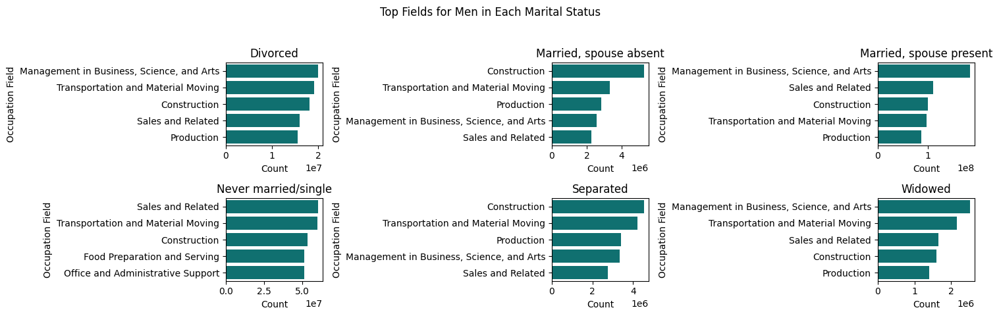

In [ ]:
# Filter the data for males
male_data = df_gender_copy[df_gender_copy['SEX_Label'] == 'Male']

# Group the data by marital status and occupation field, summing the weighted counts
grouped_data = male_data.groupby(['MARST_Label', 'OCC_FIELD'])['WEIGHT'].sum().reset_index()

# Get the top fields that men like to work in for each marital status
top_fields_per_marital_status = grouped_data.groupby('MARST_Label').apply(lambda x: x.nlargest(5, 'WEIGHT')).reset_index(drop=True)

# Create separate plots for each marital status
fig, axes = plt.subplots(2, 3, figsize=(15, 5), sharex=False, sharey=False)

marital_statuses = top_fields_per_marital_status['MARST_Label'].unique()

for i, marital_status in enumerate(marital_statuses):
    # Filter data for the current marital status
    data = top_fields_per_marital_status[top_fields_per_marital_status['MARST_Label'] == marital_status]
    ax = axes[i // 3, i % 3]

    # Plot the top fields for the current marital status
    sns.barplot(x='WEIGHT', y='OCC_FIELD', data=data, ax=ax, color='teal')
    ax.set_title(f'{marital_status}')
    ax.set_xlabel('Count')
    ax.set_ylabel('Occupation Field')

# Adjust layout and display the plot
plt.suptitle('Top Fields for Men in Each Marital Status')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Add some space at the top for the title
plt.show()


#### **Connection with Race**


##### **Q7: Is there an association between gender representation and marital status within each occupation field?**

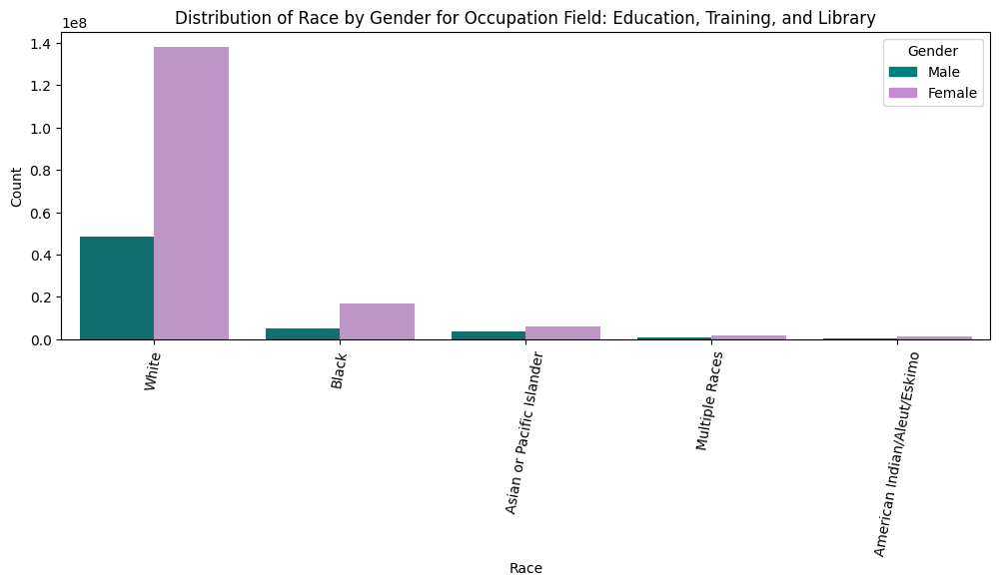

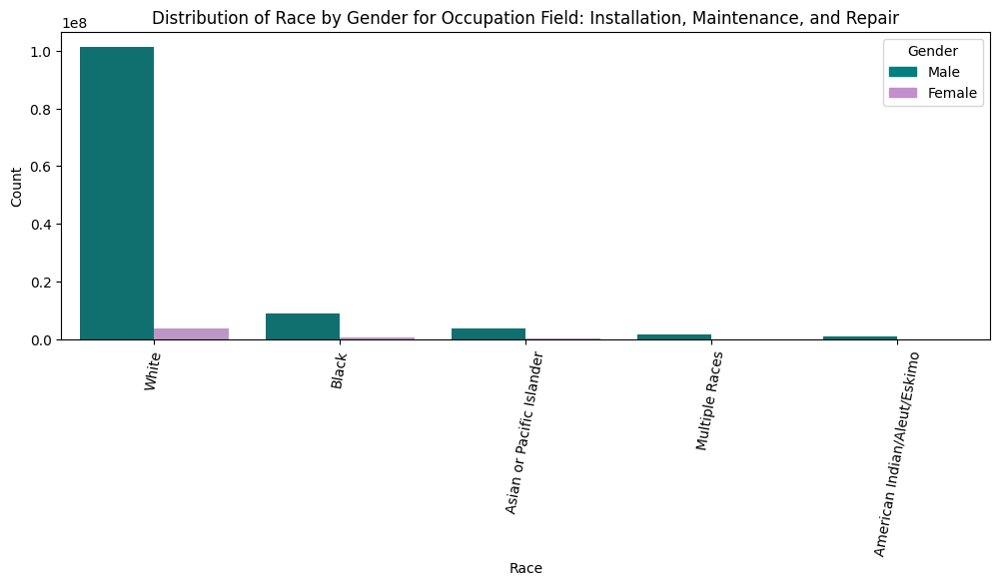

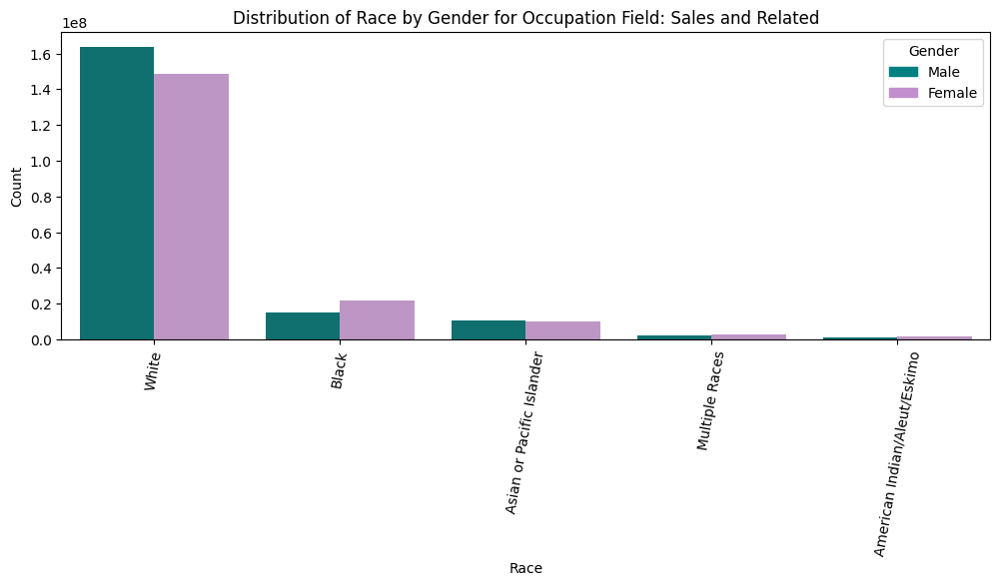

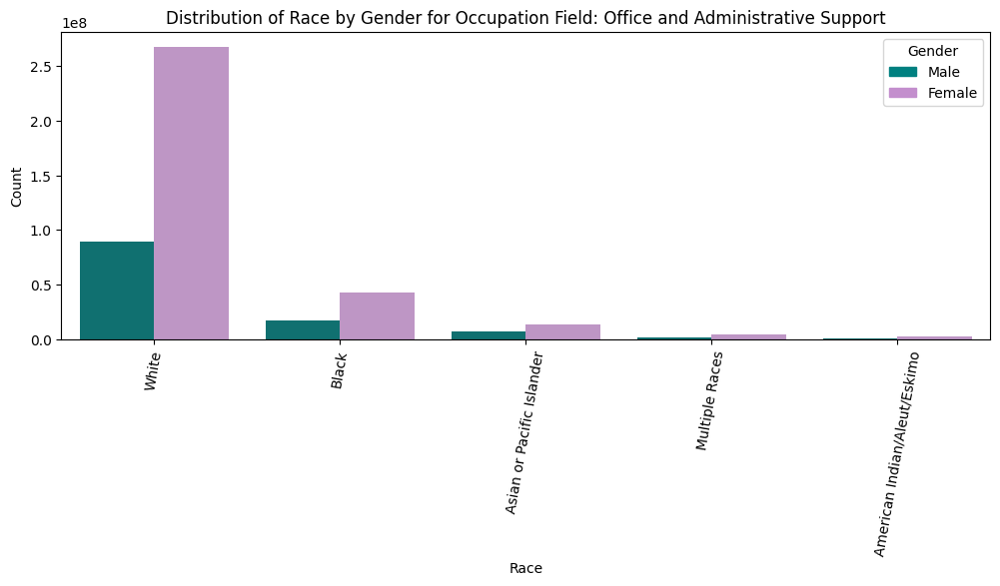

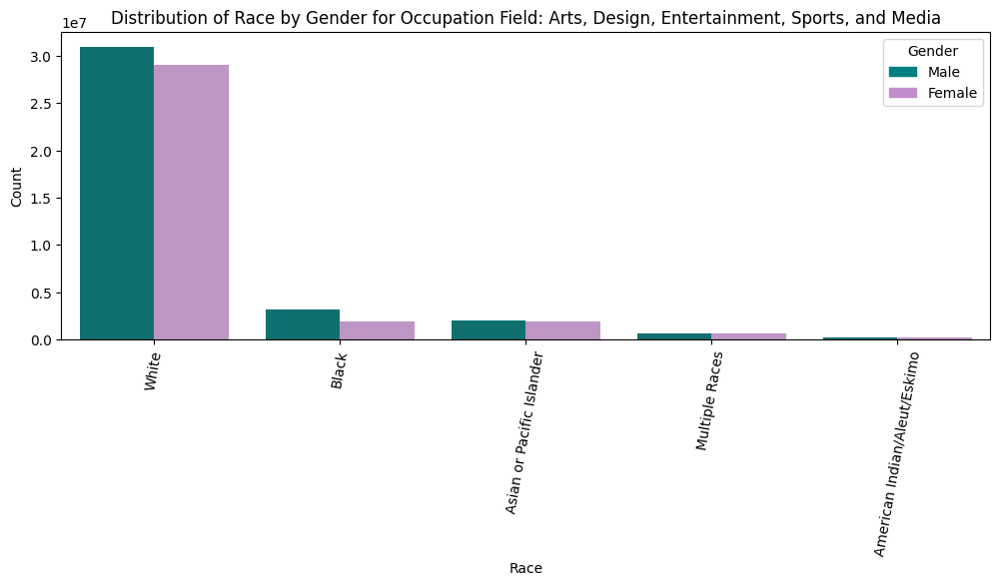

...

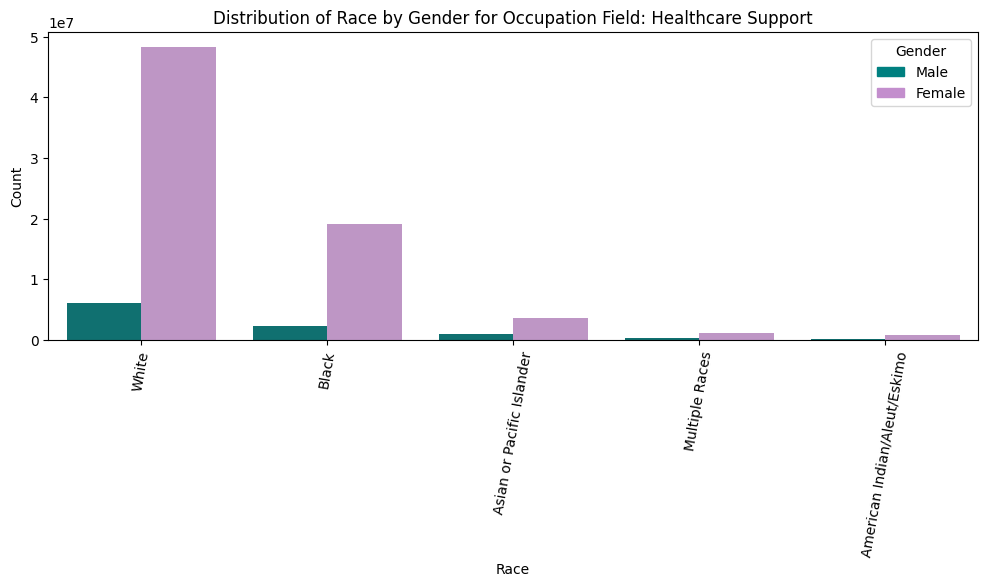

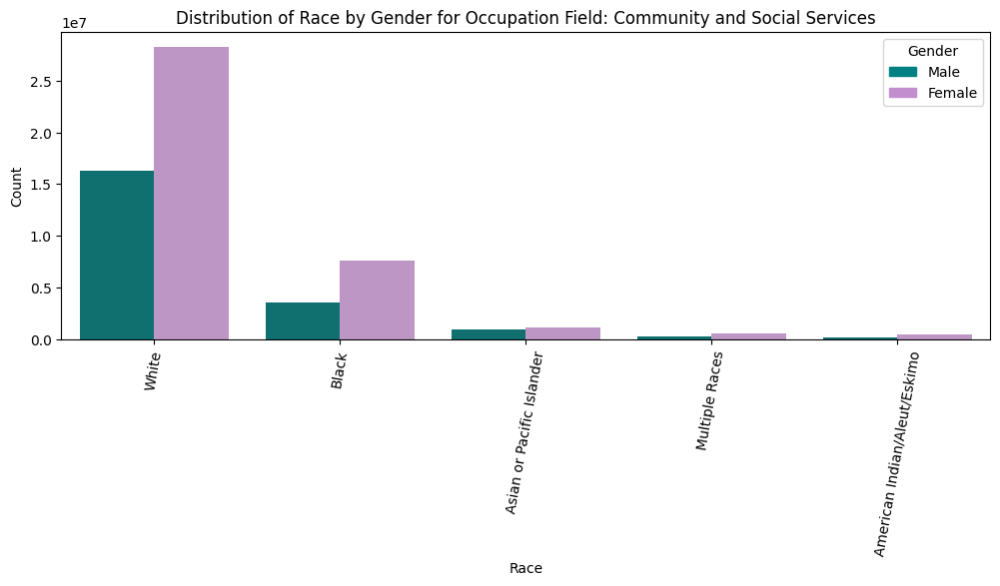

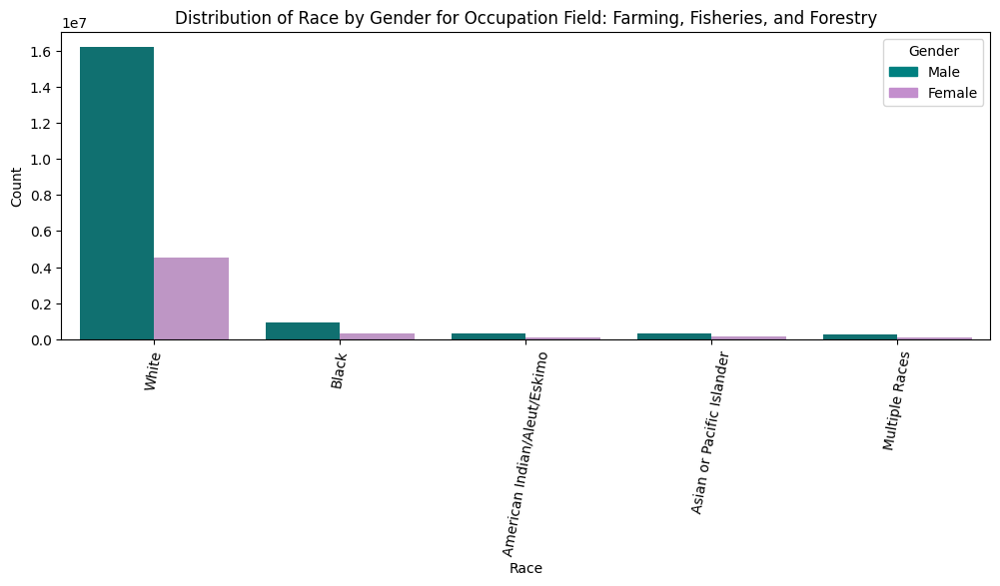

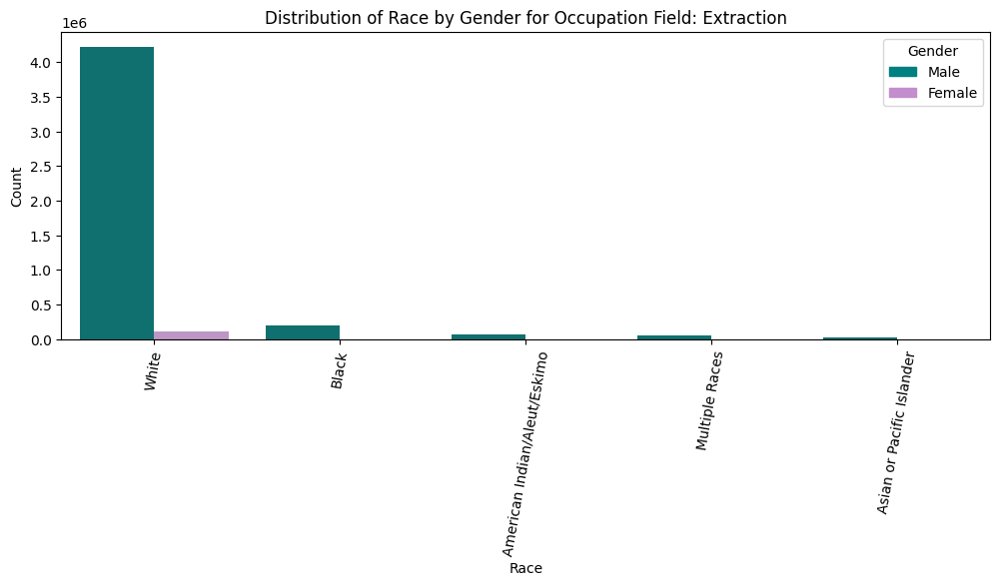

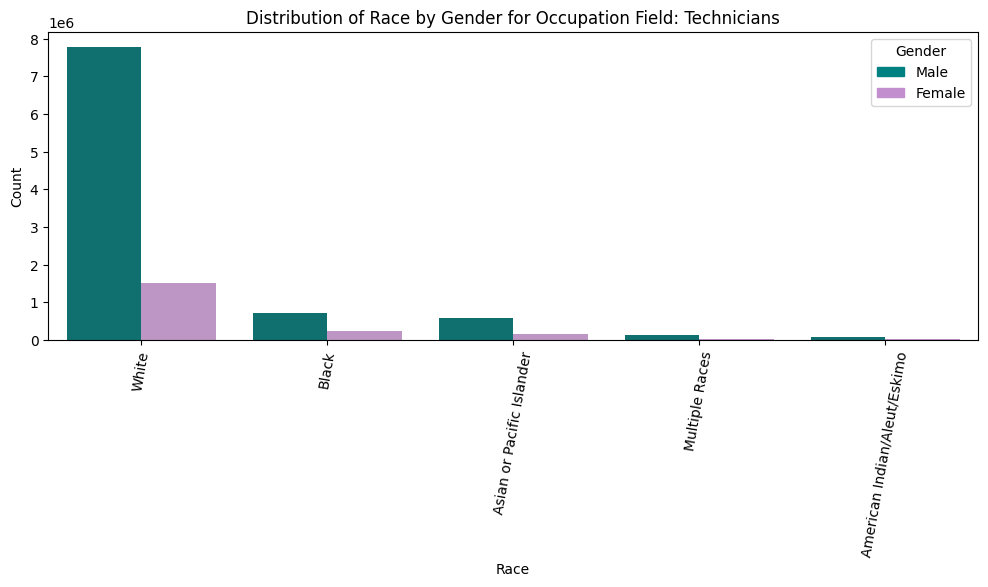

In [ ]:
# Iterate over unique values of 'OCC_FIELD' and create countplots for each one
for occ_field in df_gender['OCC_FIELD'].unique():
    data_occ_field = df_gender[df_gender['OCC_FIELD'] == occ_field]
    title = f'Distribution of Race by Gender for Occupation Field: {occ_field}'
    side_by_side_countplot(data_occ_field, 'RACE_GROUP', None, 'Race', 'Count', title)

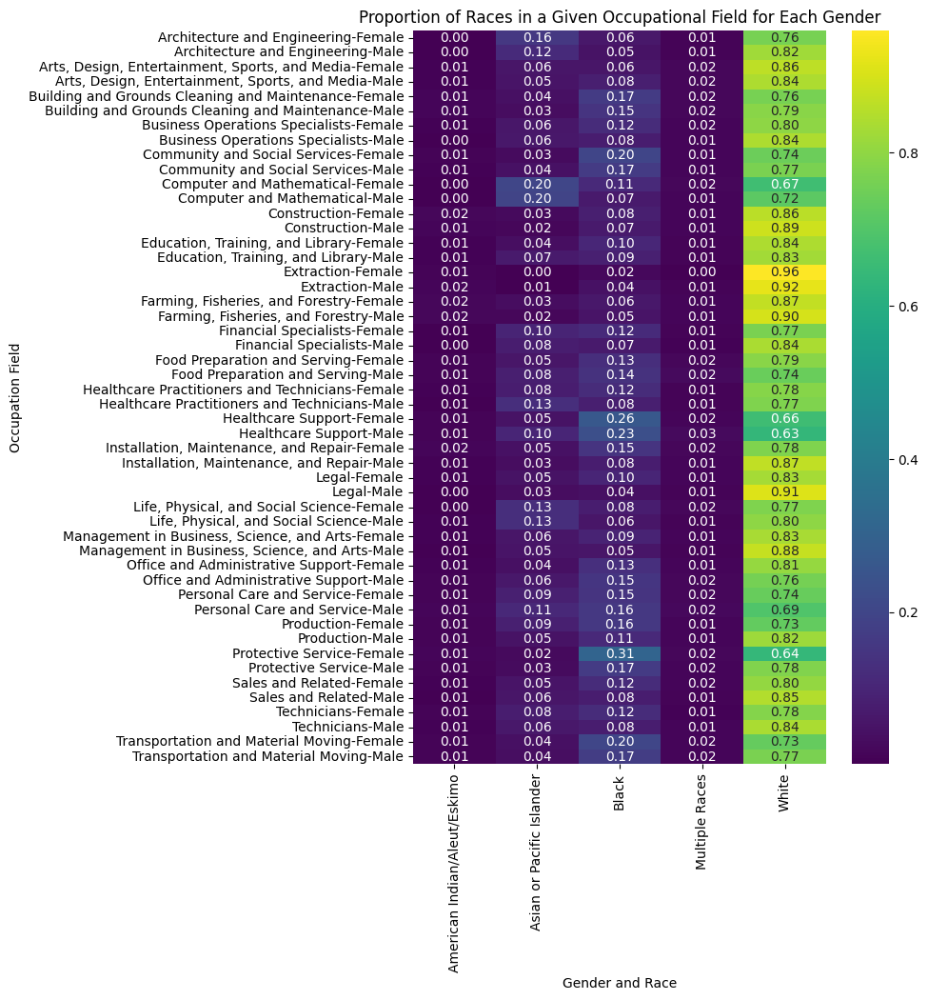

In [ ]:
# Create a weighted contingency table for ratios
contingency_table = df_gender_copy.groupby(['OCC_FIELD', 'SEX_Label', 'RACE_GROUP'])['WEIGHT'].sum().unstack(fill_value=0)

# Calculate row-wise sums for each occupation field
row_sums = contingency_table.sum(axis=1)

# Divide each element in the contingency table by the corresponding row sum to get ratios
contingency_table_ratios = contingency_table.div(row_sums, axis=0)

# Plot the heatmap
plt.figure(figsize=(7, 10))
sns.heatmap(contingency_table_ratios, cmap='viridis', annot=True, fmt='.2f', cbar=True)
plt.title('Proportion of Races in a Given Occupational Field for Each Gender')
plt.xlabel('Gender and Race')
plt.ylabel('Occupation Field')

plt.show()


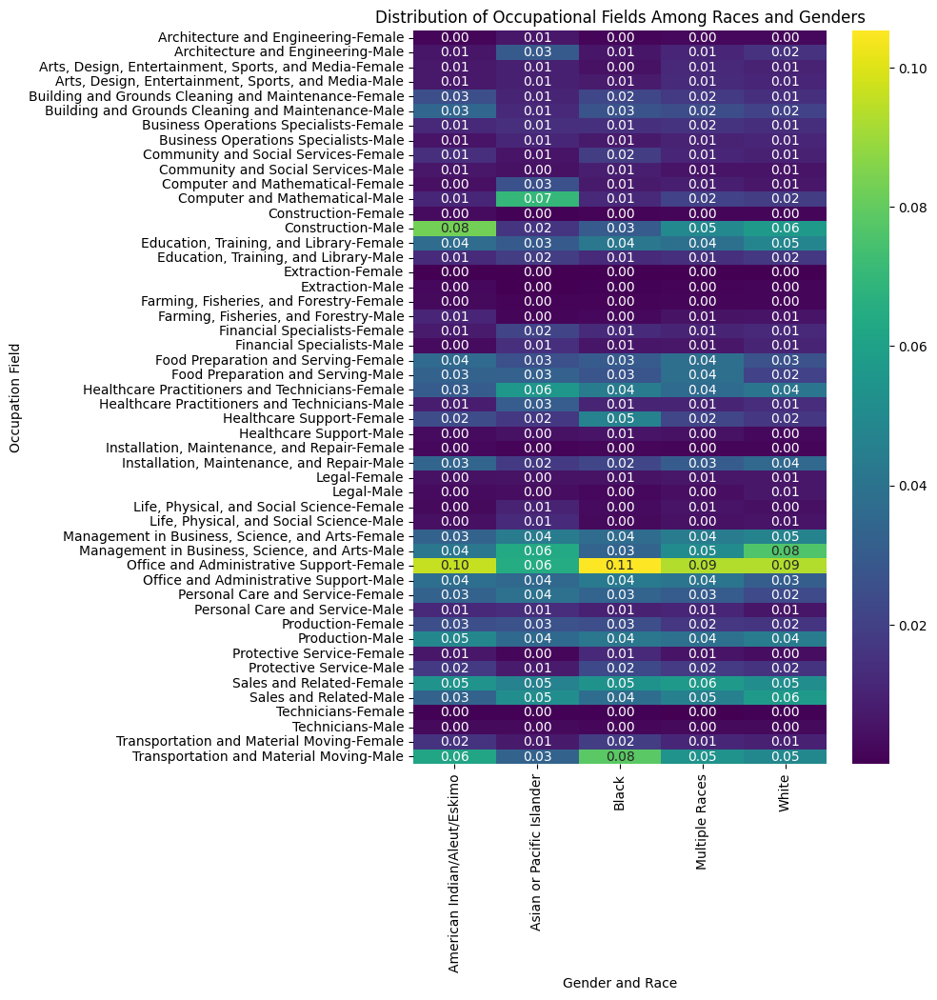

In [ ]:
# Create a weighted contingency table for ratios
contingency_table = df_gender_copy.groupby(['OCC_FIELD', 'SEX_Label', 'RACE_GROUP'])['WEIGHT'].sum().unstack(fill_value=0)

# Calculate row-wise sums for each occupation field
row_sums = contingency_table.sum(axis=0)

# Divide each element in the contingency table by the corresponding row sum to get ratios
contingency_table_ratios = contingency_table.div(row_sums, axis=1)

# Plot the heatmap
plt.figure(figsize=(7, 10))
sns.heatmap(contingency_table_ratios, cmap='viridis', annot=True, fmt='.2f', cbar=True)
plt.title('Distribution of Occupational Fields Among Races and Genders')
plt.xlabel('Gender and Race')
plt.ylabel('Occupation Field')

plt.show()


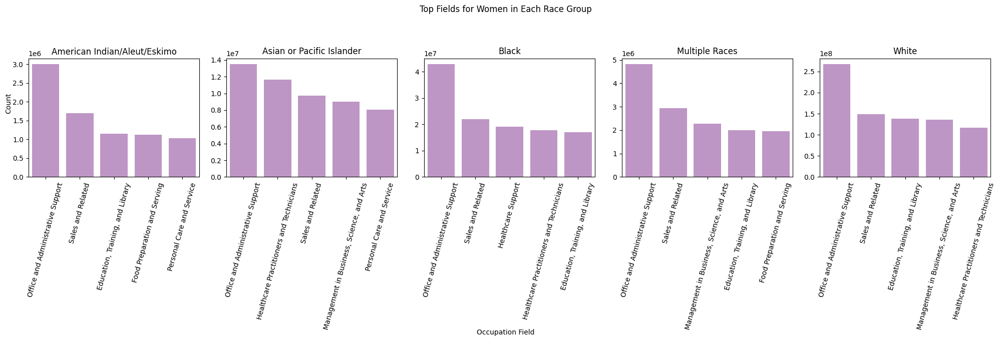

In [ ]:
# Filter the data for females
female_data = df_gender_copy[df_gender_copy['SEX_Label'] == 'Female']

# Group the data by race and occupation field, summing the weighted counts
grouped_data = female_data.groupby(['RACE_GROUP', 'OCC_FIELD'])['WEIGHT'].sum().reset_index()

# Get the top fields that women like to work in for each race category
top_fields_per_race = grouped_data.groupby('RACE_GROUP').apply(lambda x: x.nlargest(5, 'WEIGHT')).reset_index(drop=True)

# Create separate plots for each race category
fig, axes = plt.subplots(1, 5, figsize=(20, 7), sharex=False, sharey=False)

race_categories = top_fields_per_race['RACE_GROUP'].unique()

for i, race_category in enumerate(race_categories):
    # Filter data for the current race category
    data = top_fields_per_race[top_fields_per_race['RACE_GROUP'] == race_category]
    ax = axes[i]

    # Plot the top fields for the current race category
    sns.barplot(x='OCC_FIELD', y='WEIGHT', data=data, ax=ax, color='#c38ecd')
    ax.set_title(f'{race_category}')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(axis='x', rotation=75)  # Rotate x-axis labels

# Adjust layout and display the plot
# Set labels for the overall plot
fig.text(0.5, 0.04, 'Occupation Field', ha='center')
fig.text(0.00, 0.7, 'Count', va='center', rotation='vertical')
plt.suptitle('Top Fields for Women in Each Race Group')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Add some space at the top for the title
plt.show()


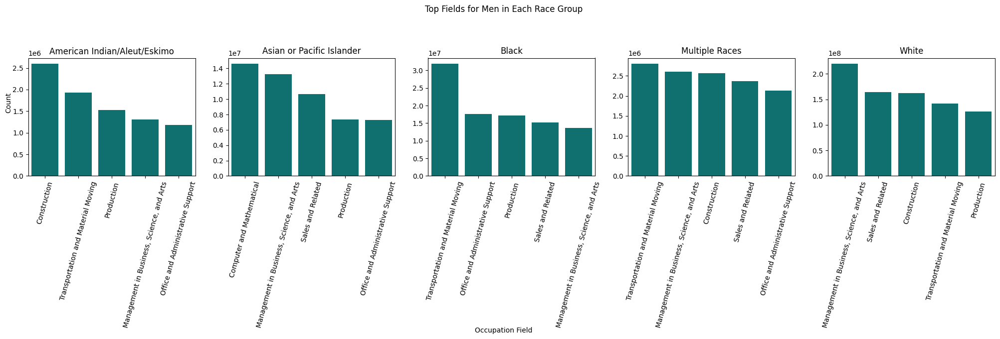

In [ ]:
# Filter the data for males
male_data = df_gender_copy[df_gender_copy['SEX_Label'] == 'Male']

# Group the data by race and occupation field, summing the weighted counts
grouped_data = male_data.groupby(['RACE_GROUP', 'OCC_FIELD'])['WEIGHT'].sum().reset_index()

# Get the top fields that men like to work in for each race category
top_fields_per_race = grouped_data.groupby('RACE_GROUP').apply(lambda x: x.nlargest(5, 'WEIGHT')).reset_index(drop=True)

# Create separate plots for each race category
fig, axes = plt.subplots(1, 5, figsize=(20, 7), sharex=False, sharey=False)

race_categories = top_fields_per_race['RACE_GROUP'].unique()

for i, race_category in enumerate(race_categories):
    # Filter data for the current race category
    data = top_fields_per_race[top_fields_per_race['RACE_GROUP'] == race_category]
    ax = axes[i]

    # Plot the top fields for the current race category
    sns.barplot(x='OCC_FIELD', y='WEIGHT', data=data, ax=ax, color='teal')
    ax.set_title(f'{race_category}')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.tick_params(axis='x', rotation=75)  # Rotate x-axis labels

# Adjust layout and display the plot
# Set labels for the overall plot
fig.text(0.5, 0.04, 'Occupation Field', ha='center')
fig.text(0.00, 0.7, 'Count', va='center', rotation='vertical')
plt.suptitle('Top Fields for Men in Each Race Group')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Add some space at the top for the title
plt.show()


#### **Connection with Income**

In [ ]:
income_summary = df_gender.groupby('SEX')['INCWAGE'].describe()
print("Descriptive Statistics of Income by Gender:")
print(income_summary)

Descriptive Statistics of Income by Gender:
         count          mean           std  min      25%      50%      75%  \
SEX                                                                          
1    1086398.0  52581.389432  68777.239486  0.0  19000.0  38000.0  65000.0   
2    1004475.0  34903.964159  44719.053508  0.0  12000.0  26000.0  45000.0   

           max  
SEX             
1    2099999.0  
2    1999999.0  


In [ ]:
sns.boxplot(data=df_gender, x='SEX', y='INCWAGE', color='skyblue')
plt.title('Distribution of Income by Gender')
plt.xlabel('Gender')
plt.ylabel('Income')
plt.xticks(ticks=[0, 1], labels=['Male', 'Female'])
plt.show()

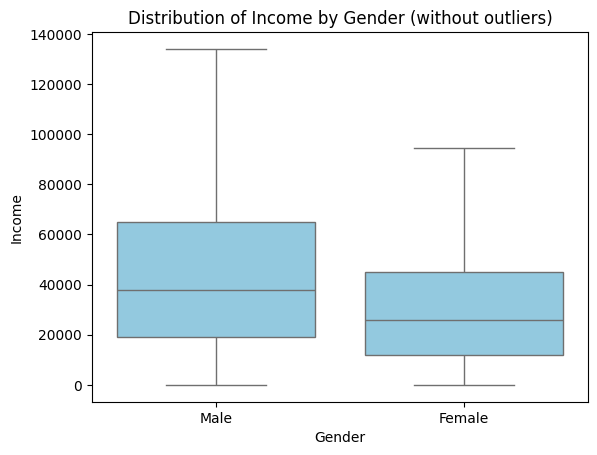

In [ ]:
#plt.figure(figsize=(10, 6))
sns.boxplot(data=df_gender, x='SEX', y='INCWAGE', color='skyblue', showfliers=False)
plt.title('Distribution of Income by Gender (without outliers)')
plt.xlabel('Gender')
plt.ylabel('Income')
plt.xticks(ticks=[0, 1], labels=['Male', 'Female'])
plt.show()

In [ ]:
male_data = df_gender[df_gender['SEX'] == 1]
female_data = df_gender[df_gender['SEX'] == 2]
q1_male = wquantiles.quantile(male_data.INCWAGE, male_data.WEIGHT, 0.25)
q2_male = wquantiles.quantile(male_data.INCWAGE, male_data.WEIGHT, 0.5)
q3_male = wquantiles.quantile(male_data.INCWAGE, male_data.WEIGHT, 0.75)
q4_male = wquantiles.quantile(male_data.INCWAGE, male_data.WEIGHT, 1)

q1_female = wquantiles.quantile(female_data.INCWAGE, female_data.WEIGHT, 0.25)
q2_female = wquantiles.quantile(female_data.INCWAGE, female_data.WEIGHT, 0.5)
q3_female = wquantiles.quantile(female_data.INCWAGE, female_data.WEIGHT, 0.75)
q4_female = wquantiles.quantile(female_data.INCWAGE, female_data.WEIGHT, 1)

In [ ]:
print("Quantiles for Males:")
print("Q1:", q1_male)
print("Q2:", q2_male)
print("Q3:", q3_male)
print("Q4:", q4_male)
print()

print("Quantiles for Females:")
print("Q1:", q1_female)
print("Q2:", q2_female)
print("Q3:", q3_female)
print("Q4:", q4_female)

Quantiles for Males:
Q1: 19000.0
Q2: 38000.0
Q3: 65000.0
Q4: 2099999.0

Quantiles for Females:
Q1: 13000.0
Q2: 28000.0
Q3: 47500.0
Q4: 1999999.0


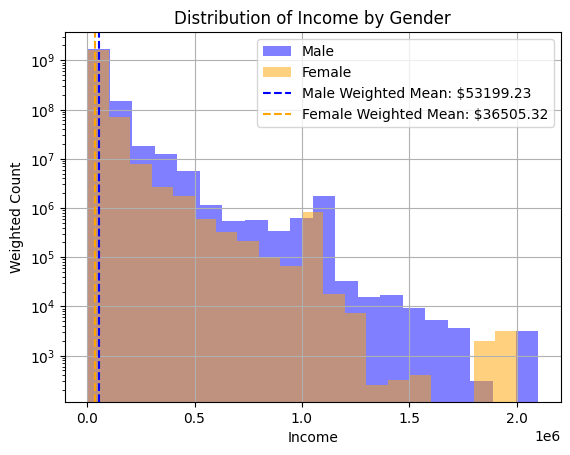

In [ ]:
# Create histograms for male and female income with weights
#plt.figure(figsize=(10, 6))
plt.hist(male_data['INCWAGE'], bins=20, weights=male_data['WEIGHT'], alpha=0.5, color='blue', label='Male', log=True)
plt.hist(female_data['INCWAGE'], bins=20, weights=female_data['WEIGHT'], alpha=0.5, color='orange', label='Female', log=True)

# Calculate and plot weighted mean lines for male and female
weighted_mean_male = np.average(male_data['INCWAGE'], weights=male_data['WEIGHT'])
weighted_mean_female = np.average(female_data['INCWAGE'], weights=female_data['WEIGHT'])
plt.axvline(x=weighted_mean_male, color='blue', linestyle='--', label=f'Male Weighted Mean: ${weighted_mean_male:.2f}')
plt.axvline(x=weighted_mean_female, color='orange', linestyle='--', label=f'Female Weighted Mean: ${weighted_mean_female:.2f}')

# Add labels and title
plt.title('Distribution of Income by Gender')
plt.xlabel('Income')
plt.ylabel('Weighted Count')
plt.legend()
plt.grid(True)

# Show plot
plt.show()

**Hypothesis Testing**

Are income and gender independent?

In [ ]:
# Perform weighted t-test
result = ws.ttest_ind(male_data.INCWAGE, female_data.INCWAGE, weights=(male_data.WEIGHT, female_data.WEIGHT))

# Unpack the result
t_stat = result[0]
p_value = result[1]

# Print results
print("Weighted T-test Results:")
print("T-statistic:", t_stat)
print("P-value:", p_value)


Weighted T-test Results:
T-statistic: 8211.254641071626
P-value: 0.0


In [ ]:
# Save results to a JSON file
with open('IntermediaryResults/income_gender_t_test_results.json', 'w') as f:
    json.dump({
        'T-statistic': t_stat,
        'P-value': p_value
    }, f)

In [ ]:
def t_test_income_by_variable(df, variable):
    groups = df[variable].unique()
    significance_level = 0.05
    results = []

    for group in groups:
        male_data = df[(df['SEX'] == 1) & (df[variable] == group)]
        female_data = df[(df['SEX'] == 2) & (df[variable] == group)]

        result = ws.ttest_ind(male_data.INCWAGE, female_data.INCWAGE, weights=(male_data.WEIGHT, female_data.WEIGHT))

        # Unpack the result
        t_stat = result[0]
        p_value = result[1]

        if p_value < significance_level:
            hypothesis_result = "Reject the null hypothesis: There is a significant difference in income between genders."
        else:
            hypothesis_result = "Fail to reject the null hypothesis: There is no significant difference in income between genders."

        results.append({
            'Variable': variable,
            'Group': group,
            'T-statistic': t_stat,
            'P-value': p_value,
            'Hypothesis Result': hypothesis_result
        })

    return results

In [ ]:
# Perform hypothesis tests
results_educ = t_test_income_by_variable(df_gender_copy, 'EDUC_Label')
results_race = t_test_income_by_variable(df_gender, 'RACE_GROUP')
results_marst = t_test_income_by_variable(df_gender_copy, 'MARST_Label')
results_occ_field = t_test_income_by_variable(df_gender, 'OCC_FIELD_LY')

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/weightstats.py:652: RuntimeWarning: invalid value encountered in scalar divide
  tstat = (value1 - value2 - diff) / std_diff


**Education**

In [ ]:
print("Results for EDUC:")
print(json.dumps(results_educ, indent=4))
print()

Results for EDUC:
[
    {
        "Variable": "EDUC_Label",
        "Group": "Doctorate degree",
        "T-statistic": 1094.972917318648,
        "P-value": 0.0,
        "Hypothesis Result": "Reject the null hypothesis: There is a significant difference in income between genders."
    },
    {
        "Variable": "EDUC_Label",
        "Group": "Some college but no degree",
        "T-statistic": 4375.8751022408815,
        "P-value": 0.0,
        "Hypothesis Result": "Reject the null hypothesis: There is a significant difference in income between genders."
    },
    {
        "Variable": "EDUC_Label",
        "Group": "High school diploma or equivalent",
        "T-statistic": 4892.313128765141,
        "P-value": 0.0,
        "Hypothesis Result": "Reject the null hypothesis: There is a significant difference in income between genders."
    },
    {
        "Variable": "EDUC_Label",
        "Group": "Master's degree",
        "T-statistic": 3489.571824639877,
        "P-value": 0.0,


**Race**

In [ ]:
print("Results for RACE_GROUP:")
print(json.dumps(results_race, indent=4))
print()

Results for RACE_GROUP:
[
    {
        "Variable": "RACE_GROUP",
        "Group": "White",
        "T-statistic": 7747.032210124931,
        "P-value": 0.0,
        "Hypothesis Result": "Reject the null hypothesis: There is a significant difference in income between genders."
    },
    {
        "Variable": "RACE_GROUP",
        "Group": "Black",
        "T-statistic": 1422.6553668538797,
        "P-value": 0.0,
        "Hypothesis Result": "Reject the null hypothesis: There is a significant difference in income between genders."
    },
    {
        "Variable": "RACE_GROUP",
        "Group": "Asian or Pacific Islander",
        "T-statistic": 1882.8725569157284,
        "P-value": 0.0,
        "Hypothesis Result": "Reject the null hypothesis: There is a significant difference in income between genders."
    },
    {
        "Variable": "RACE_GROUP",
        "Group": "American Indian/Aleut/Eskimo",
        "T-statistic": 576.1111821731354,
        "P-value": 0.0,
        "Hypothesis 

**Marital Status**

In [ ]:
print("Results for MARST:")
print(json.dumps(results_marst, indent=4))
print()

Results for MARST:
[
    {
        "Variable": "MARST_Label",
        "Group": "Divorced",
        "T-statistic": 1618.516168846459,
        "P-value": 0.0,
        "Hypothesis Result": "Reject the null hypothesis: There is a significant difference in income between genders."
    },
    {
        "Variable": "MARST_Label",
        "Group": "Never married/single",
        "T-statistic": 1475.2133444377569,
        "P-value": 0.0,
        "Hypothesis Result": "Reject the null hypothesis: There is a significant difference in income between genders."
    },
    {
        "Variable": "MARST_Label",
        "Group": "Widowed",
        "T-statistic": 833.3546005771581,
        "P-value": 0.0,
        "Hypothesis Result": "Reject the null hypothesis: There is a significant difference in income between genders."
    },
    {
        "Variable": "MARST_Label",
        "Group": "Separated",
        "T-statistic": 1172.9971032645628,
        "P-value": 0.0,
        "Hypothesis Result": "Reject the

**Occupational Field**

In [ ]:
print("Results for OCC_FIELD_LY:")
print(json.dumps(results_occ_field, indent=4))
print()

Results for OCC_FIELD_LY:
[
    {
        "Variable": "OCC_FIELD_LY",
        "Group": "Education, Training, and Library",
        "T-statistic": 2593.3277562427565,
        "P-value": 0.0,
        "Hypothesis Result": "Reject the null hypothesis: There is a significant difference in income between genders."
    },
    {
        "Variable": "OCC_FIELD_LY",
        "Group": "Installation, Maintenance, and Repair",
        "T-statistic": 193.85971444210634,
        "P-value": 0.0,
        "Hypothesis Result": "Reject the null hypothesis: There is a significant difference in income between genders."
    },
    {
        "Variable": "OCC_FIELD_LY",
        "Group": "Sales and Related",
        "T-statistic": 3920.321164708429,
        "P-value": 0.0,
        "Hypothesis Result": "Reject the null hypothesis: There is a significant difference in income between genders."
    },
    {
        "Variable": "OCC_FIELD_LY",
        "Group": "Office and Administrative Support",
        "T-statistic

In [ ]:
# Save results to JSON files
with open('IntermediaryResults/tests/income_gender_t_test_results_educ.json', 'w') as f:
    json.dump(results_educ, f, indent=4)

with open('IntermediaryResults/tests/income_gender_t_test_results_race.json', 'w') as f:
    json.dump(results_race, f, indent=4)

with open('IntermediaryResults/tests/income_gender_t_test_results_marst.json', 'w') as f:
    json.dump(results_marst, f, indent=4)

with open('IntermediaryResults/tests/income_gender_t_test_results_occ_field.json', 'w') as f:
    json.dump(results_occ_field, f, indent=4)

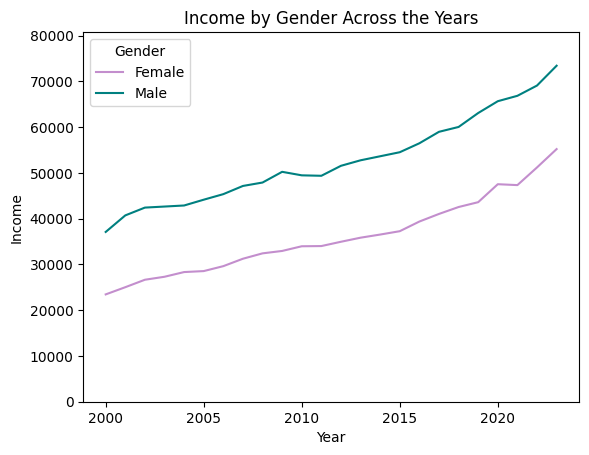

In [ ]:
# Calculate weighted average income by gender and year
weighted_avg_income = df_gender_copy.groupby(['YEAR', 'SEX_Label'])[['INCWAGE', 'WEIGHT']].apply(lambda x: (x['INCWAGE'] * x['WEIGHT']).sum() / x['WEIGHT'].sum()).reset_index()
weighted_avg_income.rename(columns={0: 'Weighted_Avg_Income'}, inplace=True)

sns.lineplot(data=weighted_avg_income, x='YEAR', y='Weighted_Avg_Income', hue='SEX_Label', palette={'Male': 'teal', 'Female': '#c38ecd'})
plt.title('Income by Gender Across the Years')
plt.xlabel('Year')
plt.ylabel('Income')
plt.legend(title='Gender')
plt.ylim(0, weighted_avg_income['Weighted_Avg_Income'].max() * 1.1)  # Set y-axis limits
plt.show()

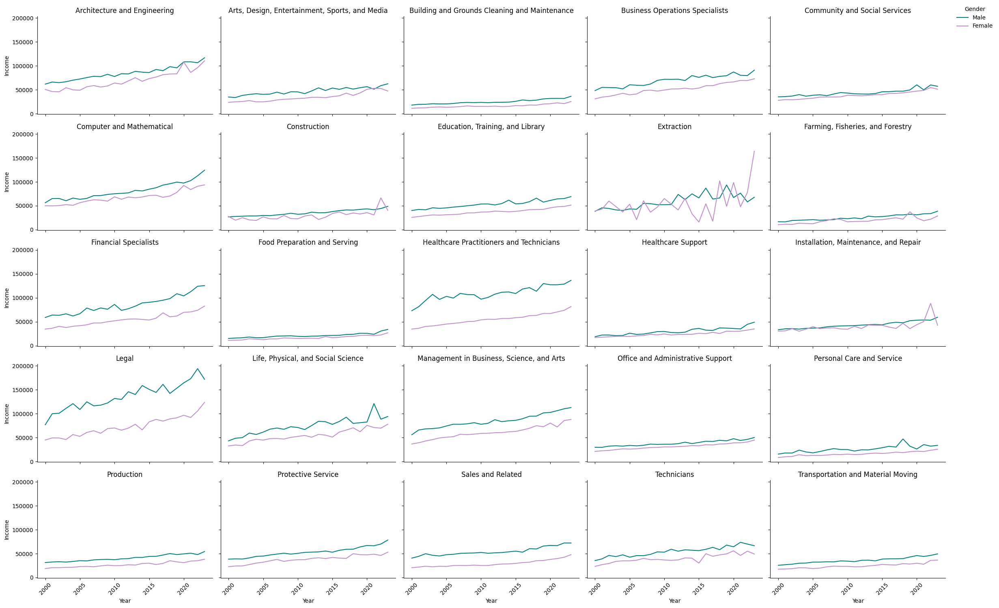

In [ ]:
def lineplot_by_occ_field(data, x, y, hue, **kwargs):
    sns.lineplot(data=data, x=x, y=y, hue=hue, palette={"Male": 'teal', "Female": '#c38ecd'}, **kwargs)
    plt.title(data['OCC_FIELD_LY'].iloc[0])
    plt.xlabel("Year")
    plt.ylabel("Income")
    plt.legend(title='Gender')
    plt.xticks(rotation=45)
    plt.tight_layout()

# Group data by occupation field, year, and gender and calculate weighted INCWAGE
df_grouped = df.groupby(['OCC_FIELD_LY', 'YEAR', 'SEX'])[["INCWAGE", "WEIGHT"]].apply(lambda x: (x['INCWAGE'] * x['WEIGHT']).sum() / x['WEIGHT'].sum()).reset_index(name='weighted_INCWAGE')
df_grouped = df_grouped[~df_grouped['OCC_FIELD_LY'].isin(['Unknown', 'Military'])]

# Map gender labels
gender_labels = {1: 'Male', 2: 'Female'}
df_grouped['SEX'] = df_grouped['SEX'].map(gender_labels)

# Plot line graphs for each occupation field
g = sns.FacetGrid(df_grouped, col='OCC_FIELD_LY', col_wrap=5, aspect=1.5)
g.map_dataframe(lineplot_by_occ_field, x='YEAR', y='weighted_INCWAGE', hue='SEX')
g.set_xlabels('Year')
g.set_ylabels('Income')
g.add_legend(title='Gender', bbox_to_anchor=(1, 1), loc='upper left')
plt.tight_layout()
plt.show()


**Highest and Lowest Paying Occupational Fields and Occupations**

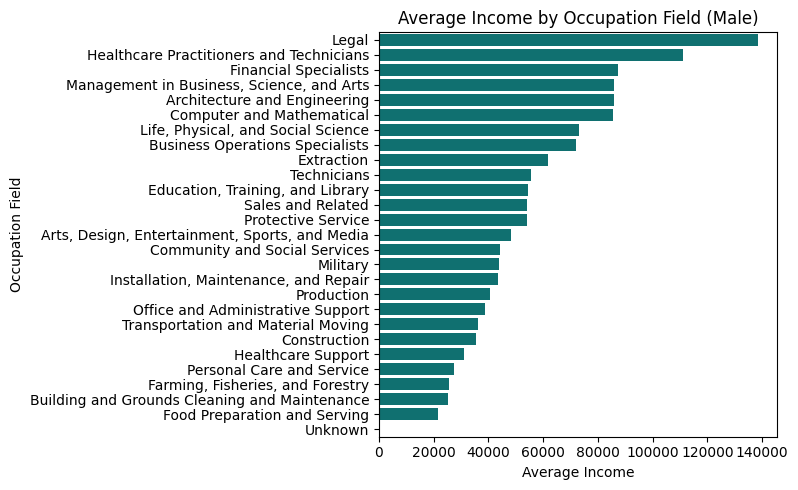

In [ ]:
# Filter the data for male gender
male_data = df[df['SEX'] == 1]

# Calculate the weighted average income for each occupation field
male_avg_income = male_data.groupby('OCC_FIELD_LY')[['INCWAGE', 'WEIGHT']].apply(lambda x: (x['INCWAGE'] * x['WEIGHT']).sum() / x['WEIGHT'].sum()).reset_index()
male_avg_income.rename(columns={0: 'Weighted_Avg_Income'}, inplace=True)

# Sort the data by weighted average income in descending order
male_avg_income_sorted = male_avg_income.sort_values(by='Weighted_Avg_Income', ascending=False)

# Plot the bar plot
plt.figure(figsize=(8, 5))
sns.barplot(data=male_avg_income_sorted, x='Weighted_Avg_Income', y='OCC_FIELD_LY', color='teal')
plt.title('Average Income by Occupation Field (Male)')
plt.xlabel('Average Income')
plt.ylabel('Occupation Field')
plt.tight_layout()
plt.show()


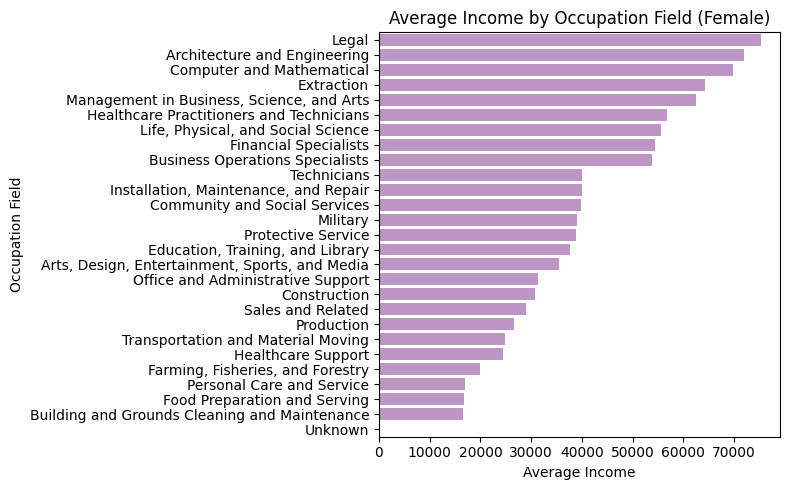

In [ ]:
# Filter the data for female gender
female_data = df[df['SEX'] == 2]

# Calculate the weighted average income for each occupation field
female_avg_income = female_data.groupby('OCC_FIELD_LY')[['INCWAGE', 'WEIGHT']].apply(lambda x: (x['INCWAGE'] * x['WEIGHT']).sum() / x['WEIGHT'].sum()).reset_index()
female_avg_income.rename(columns={0: 'Weighted_Avg_Income'}, inplace=True)

# Sort the data by weighted average income in descending order
female_avg_income_sorted = female_avg_income.sort_values(by='Weighted_Avg_Income', ascending=False)

# Plot the bar plot
plt.figure(figsize=(8, 5))
sns.barplot(data=female_avg_income_sorted, x='Weighted_Avg_Income', y='OCC_FIELD_LY', color='#c38ecd')
plt.title('Average Income by Occupation Field (Female)')
plt.xlabel('Average Income')
plt.ylabel('Occupation Field')
plt.tight_layout()
plt.show()


In [ ]:
# Merge df_gender with occ2010_labels to get occupation labels
df_gender_labeled = df_gender_copy.merge(occ2010_labels, left_on='OCC10LY', right_on='Code')
# Calculate weighted average income by gender and occupation
weighted_avg_income_gender_occupation = df_gender_labeled.groupby(['SEX_Label', 'Label'])[['INCWAGE', 'WEIGHT']].apply(lambda x: (x['INCWAGE'] * x['WEIGHT']).sum() / x['WEIGHT'].sum()).reset_index()
weighted_avg_income_gender_occupation.rename(columns={0: 'Weighted_Avg_Income'}, inplace=True)

In [ ]:
# Remove Not In Universe values
weighted_avg_income_gender_occupation = weighted_avg_income_gender_occupation[weighted_avg_income_gender_occupation['Label'] != "NIU"]

In [ ]:
def plot_top_bottom_occupations(data, gender, ax=None):
    # Sort the data by weighted average income
    sorted_data = data.sort_values(by='Weighted_Avg_Income', ascending=False)

    # Select the top 10 and bottom 10 occupations
    top_data = sorted_data.head(10)
    bottom_data = sorted_data.tail(10)
    # Sort the bottom_data in ascending order
    bottom_data = bottom_data.sort_values(by='Weighted_Avg_Income', ascending=True)

    # Plot the bar plot for top 10 highest paying occupations
    sns.barplot(data=top_data, x='Weighted_Avg_Income', y='Label', color='purple', ax=ax[0])
    ax[0].set_title(f'10 Highest Paying Occupations ({gender})')
    ax[0].set_xlabel('Average Income')
    ax[0].set_ylabel('Occupation')

    # Plot the bar plot for bottom 10 lowest paying occupations
    sns.barplot(data=bottom_data, x='Weighted_Avg_Income', y='Label', color='yellow', ax=ax[1])
    ax[1].set_title(f'10 Lowest Paying Occupations ({gender})')
    ax[1].set_xlabel('verage Income')
    ax[1].set_ylabel('Occupation')

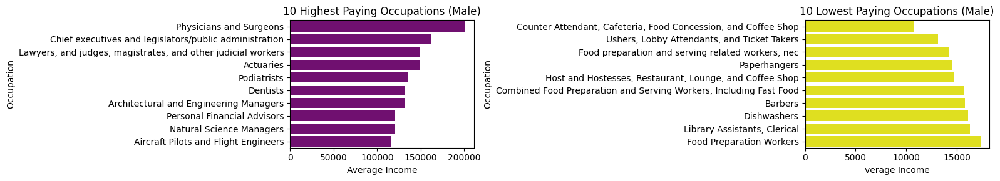

In [ ]:
# Create a figure and subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 3))

# Plot top 10 highest and lowest paying occupations for males side by side
plot_top_bottom_occupations(weighted_avg_income_gender_occupation[weighted_avg_income_gender_occupation['SEX_Label'] == "Male"], 'Male', ax=axs)

plt.tight_layout()
plt.show()

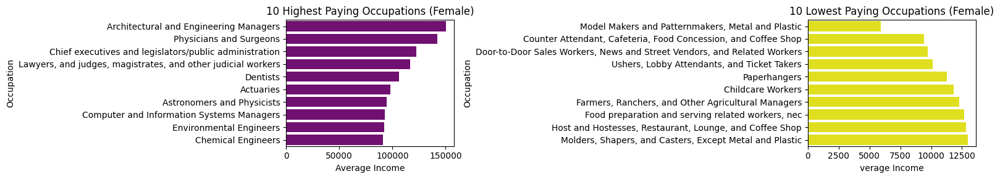

In [ ]:
# Create a figure and subplots
fig, axs = plt.subplots(1, 2, figsize=(16, 3))

# Plot top 10 highest and lowest paying occupations for males side by side
plot_top_bottom_occupations(weighted_avg_income_gender_occupation[weighted_avg_income_gender_occupation['SEX_Label'] == "Female"], 'Female', ax=axs)

plt.tight_layout()
plt.show()